# IF3170 Artificial Intelligence | Tugas Besar 2

Group Number: 31 - Kolmogorov-Arnold

Group Members:
- Roby Pratama Sitepu (13121142)
- Muhammad Fadli Alfarizi (13121140)
- Muhammad Arviano Yuono (13621034)
- Hafizh Renanto Akhmad (13621060)

## Import Libraries

In [1]:
import pandas as pd
import numpy as np

import math

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

## Import Dataset

In [2]:
basic_features_train = pd.read_csv('https://drive.google.com/uc?id=1GzheGwc1mG6z_M_kYUOMMPkE2QQrj0eW')
additional_features_train = pd.read_csv('https://drive.google.com/uc?id=1sLJLWnim9A34A8hpQwZ9PxVhMJPOrN9d')
content_features_train = pd.read_csv('https://drive.google.com/uc?id=1BunbVg1gBwI9v8h_6FxUMXJcuJDmnmMR')
flow_features_train = pd.read_csv('https://drive.google.com/uc?id=1gkIqZAd5Aza8F8-2MzMO6t53gLEUYquj')
time_features_train = pd.read_csv('https://drive.google.com/uc?id=1p38XDB0XStCbYKYVBi-Pmi2BunD6FY6J')
labels_train = pd.read_csv('https://drive.google.com/uc?id=1Dt9cKiT1y1cysxyJGlcnnEkms8ibSjCq')

basic_features_test = pd.read_csv('https://drive.google.com/uc?id=1Hg1_obL7mpwjN9gN0g1Me4jMlo8LGmVn')
additional_features_test = pd.read_csv('https://drive.google.com/uc?id=1TdeZx1bhHL8340emZhz8rW80016kdum3')
content_features_test = pd.read_csv('https://drive.google.com/uc?id=1G8spITfMGnVry6XJGz3ONg3N-CFXltrI')
flow_features_test = pd.read_csv('https://drive.google.com/uc?id=1NFcFBcHVj3LguL9BRC39HuAZTif2ws_8')
time_features_test = pd.read_csv('https://drive.google.com/uc?id=1tfmJu2HoeAePv7qKvIjAGETaqWkkhdbj')

# Exploratory Data Analysis (Optional)

Exploratory Data Analysis (EDA) is a crucial step in the data analysis process that involves examining and visualizing data sets to uncover patterns, trends, anomalies, and insights. It is the first step before applying more advanced statistical and machine learning techniques. EDA helps you to gain a deep understanding of the data you are working with, allowing you to make informed decisions and formulate hypotheses for further analysis.

In [3]:
# Merge all features on `id` column
train_set = pd.merge(basic_features_train, additional_features_train, on='id')
train_set = pd.merge(train_set, content_features_train, on='id')
train_set = pd.merge(train_set, time_features_train, on='id')
train_set = pd.merge(train_set, flow_features_train, on='id')
train_set = pd.merge(train_set, labels_train, on='id')

test_set = pd.merge(basic_features_test, additional_features_test, on='id')
test_set = pd.merge(test_set, content_features_test, on='id')
test_set = pd.merge(test_set, time_features_test, on='id')
test_set = pd.merge(test_set, flow_features_test, on='id')

# Make `id` column as index
train_set = train_set.set_index('id')
test_set = test_set.set_index('id')

# Drop `label` column from train_set dataset
train_set = train_set.drop(columns=['label'])

In [4]:
# Check the information about the data
print(train_set.info())

<class 'pandas.core.frame.DataFrame'>
Index: 175341 entries, 0 to 175340
Data columns (total 42 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   state              166536 non-null  object 
 1   dur                166619 non-null  float64
 2   sbytes             166780 non-null  float64
 3   dbytes             166472 non-null  float64
 4   sttl               166516 non-null  float64
 5   dttl               166687 non-null  float64
 6   sloss              166547 non-null  float64
 7   dloss              166363 non-null  float64
 8   service            166550 non-null  object 
 9   sload              166555 non-null  float64
 10  dload              166504 non-null  float64
 11  spkts              166687 non-null  float64
 12  dpkts              166655 non-null  float64
 13  is_sm_ips_ports    166595 non-null  float64
 14  ct_state_ttl       166706 non-null  float64
 15  ct_flw_http_mthd   166694 non-null  float64
 16  is_ftp_

In [5]:
# Define the numerical features, binary features, nominal features, and target variable
nominal_features = ['state', 'service', 'proto']
binary_features = ['is_sm_ips_ports', 'is_ftp_login']
target_variable = ['attack_cat']
numerical_features = train_set.columns.difference(nominal_features + binary_features + target_variable)
categorical_features = nominal_features + binary_features

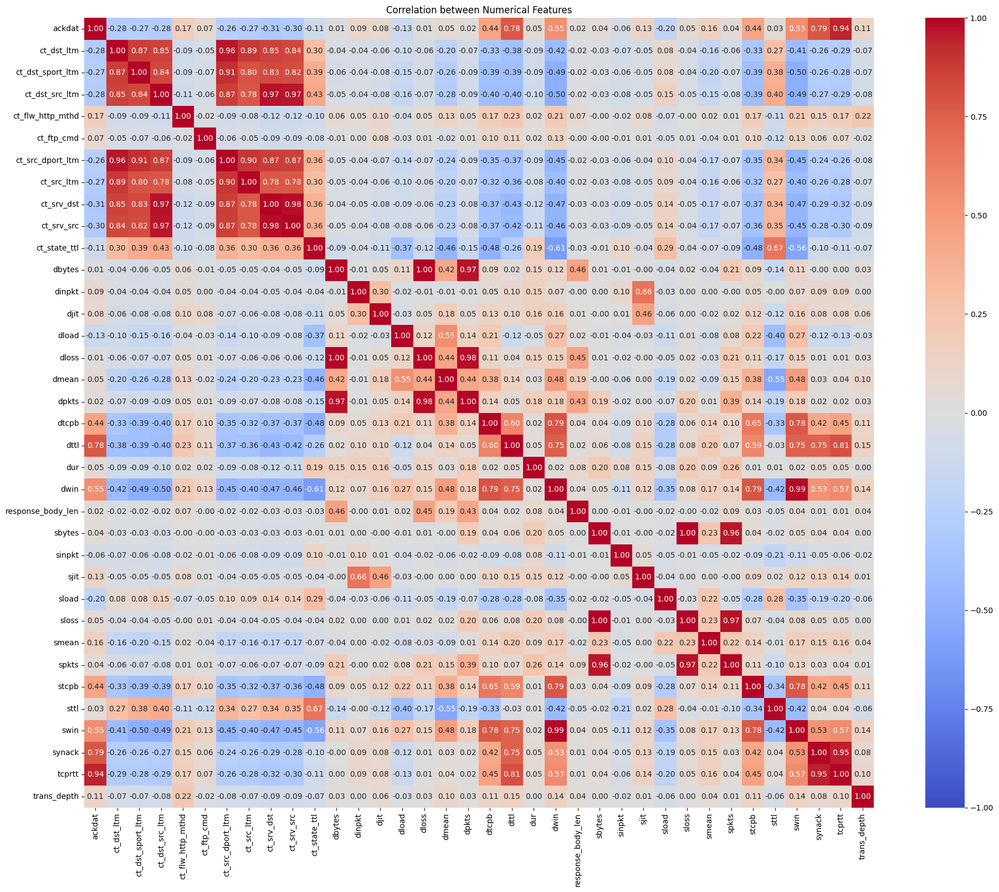

In [6]:
# Check the correlation between numerical features
plt.figure(figsize=(24, 18.5))

sns.heatmap(train_set[numerical_features].corr(method='pearson'), annot=True, fmt='.2f', cmap='coolwarm', square=True, vmin=-1, vmax=1)
plt.title('Correlation between Numerical Features')

plt.show()

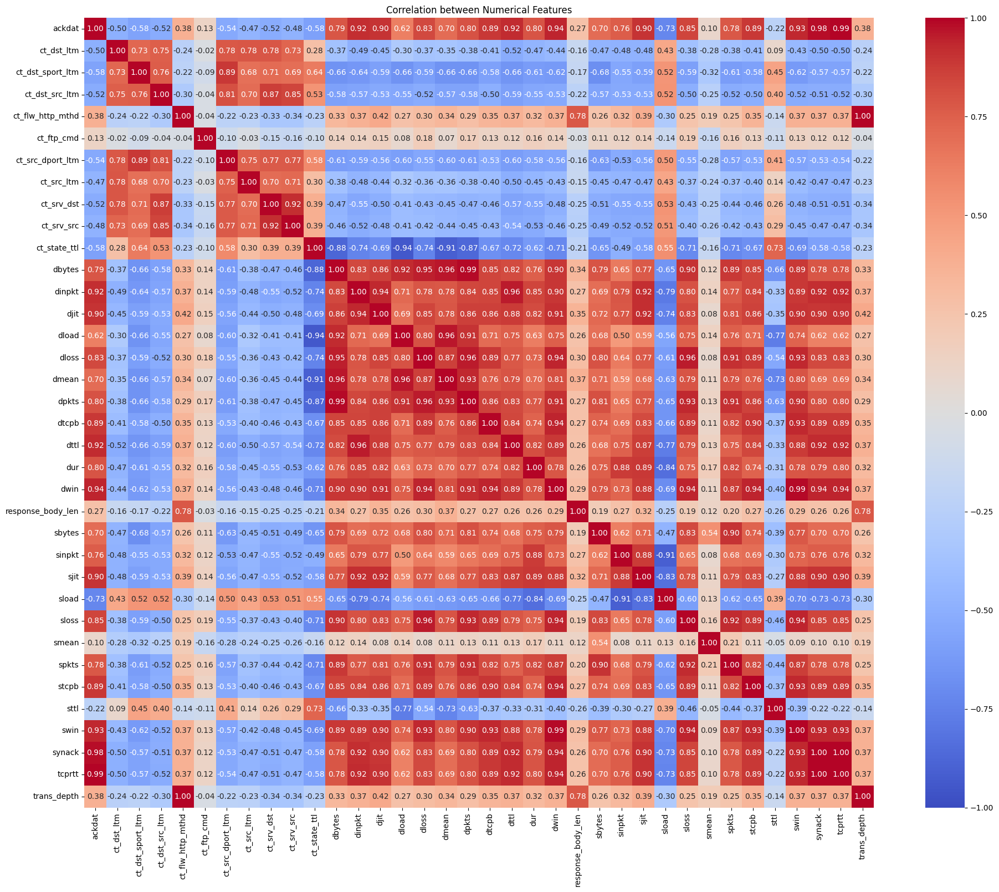

In [7]:
# Check the correlation between numerical features
plt.figure(figsize=(24, 18.5))

sns.heatmap(train_set[numerical_features].corr(method='spearman'), annot=True, fmt='.2f', cmap='coolwarm', square=True, vmin=-1, vmax=1)
plt.title('Correlation between Numerical Features')

plt.show()

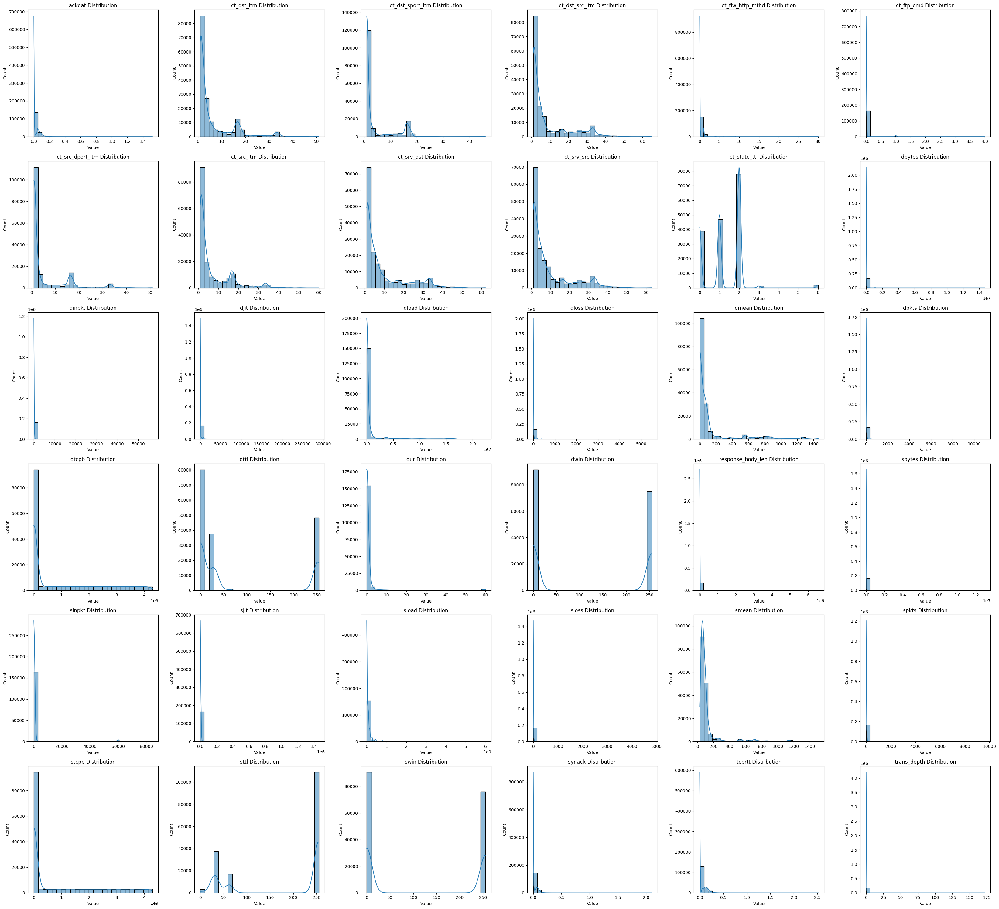

In [8]:
# Check the distribution of numerical features
fig_cols = math.ceil((len(numerical_features))**(0.5))
fig_rows = round((len(numerical_features))**(0.5))

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(fig_cols*5.5, fig_rows*5))

axes = axes.flatten()

# Iterate all over the subplots
for i, column in enumerate(numerical_features):
    sns.histplot(train_set[column], ax=axes[i], kde=True, bins='doane')
    axes[i].set_title(f"{column} Distribution")
    axes[i].set_xlabel("Value")

# Hide any unused subplots
for i in range(len(numerical_features), fig_rows * fig_cols):
    axes[i].axis('off')

# Adjust the spacing between the subplots
plt.tight_layout()

# Show the plot
plt.show()

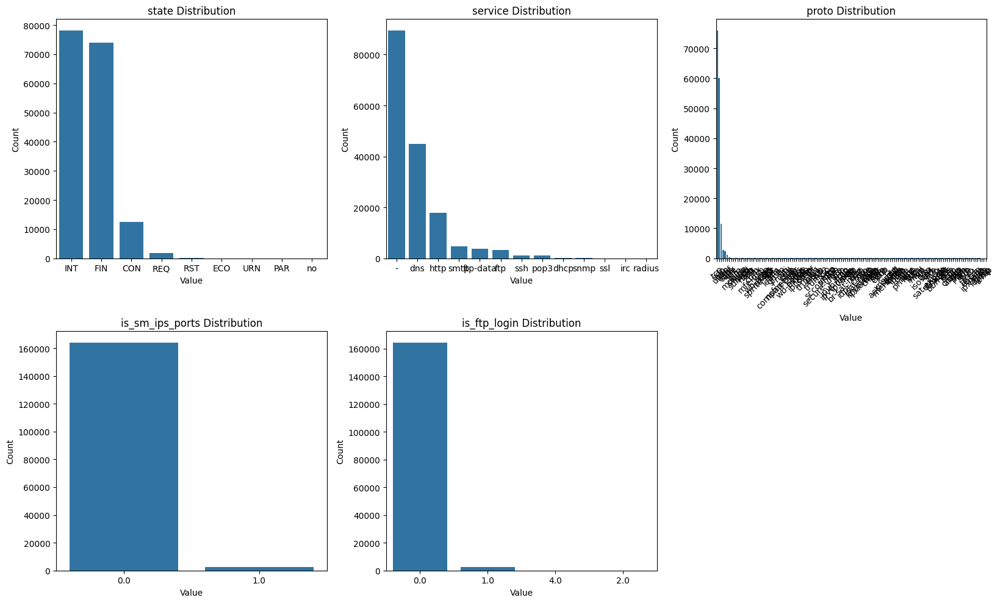

In [9]:
# Check the distribution of categorical features
fig_cols = math.ceil((len(categorical_features))**(0.5))
fig_rows = round((len(categorical_features))**(0.5))

fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(fig_cols*5.5, fig_rows*5))

axes = axes.flatten()

# Iterate all over the subplots
for i, column in enumerate(categorical_features):
    sns.countplot(x=column, data=train_set, ax=axes[i], order=train_set[column].value_counts().index)
    axes[i].set_title(f"{column} Distribution")
    axes[i].set_xlabel("Value")
    axes[i].set_ylabel("Count")

    if i==2:
        axes[i].tick_params(axis='x', rotation=45)

# Hide any unused subplots
for i in range(len(categorical_features), fig_rows * fig_cols):
    axes[i].axis('off')

# Adjust the spacing between the subplots
plt.tight_layout()

# Show the plot
plt.show()

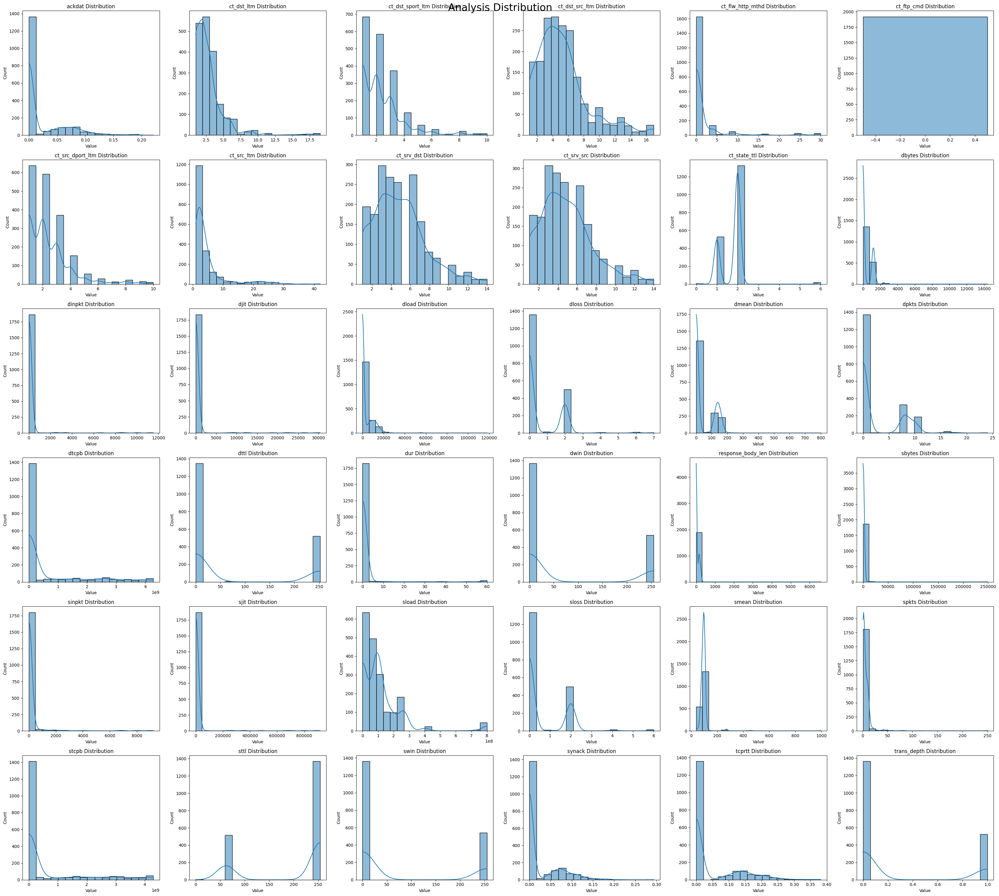

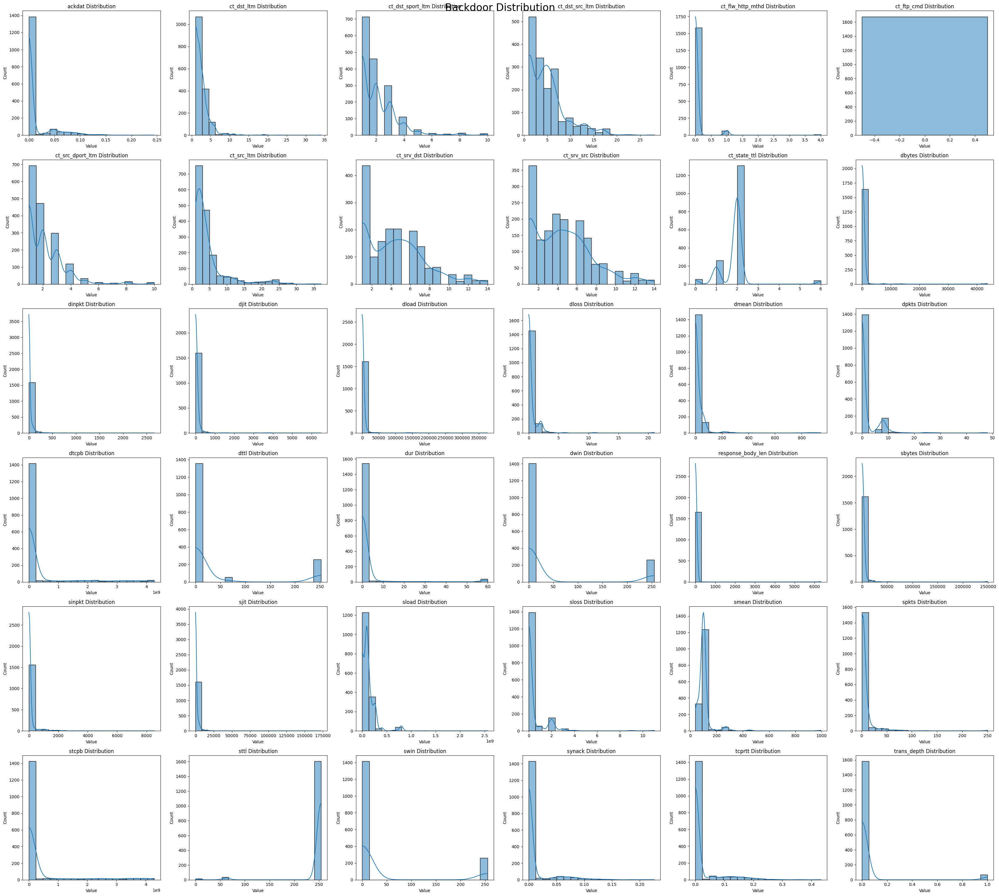

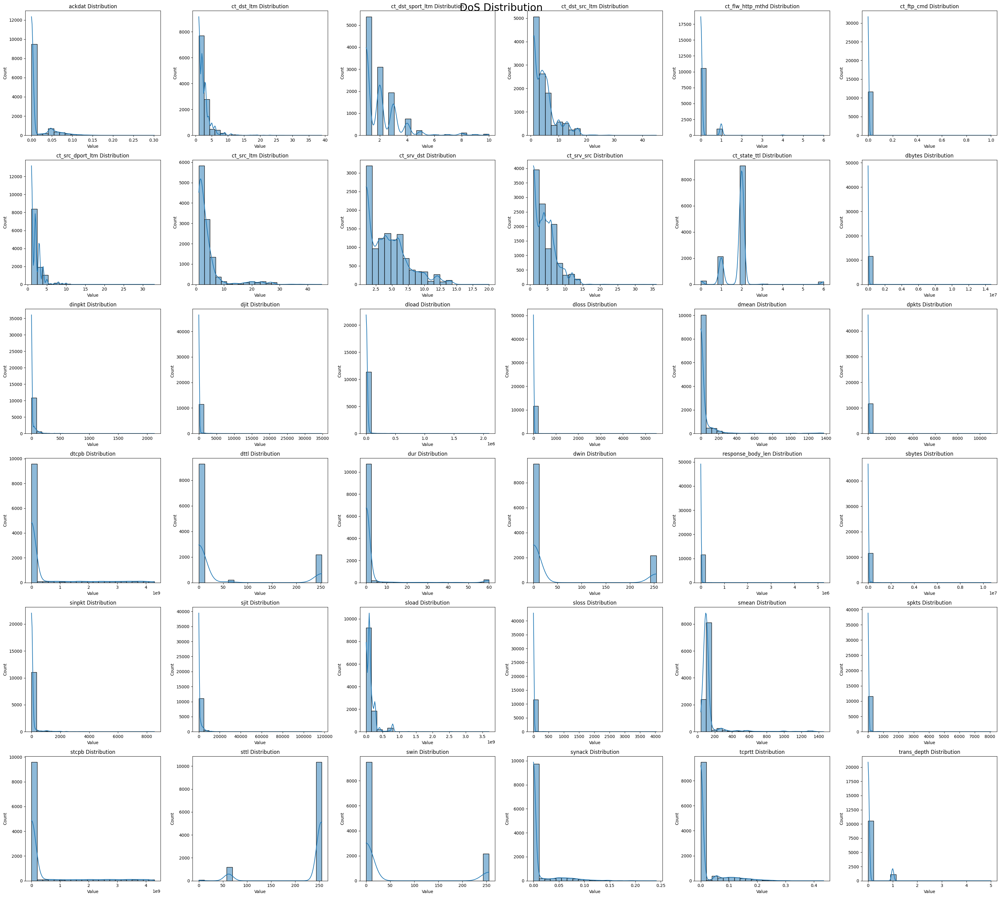

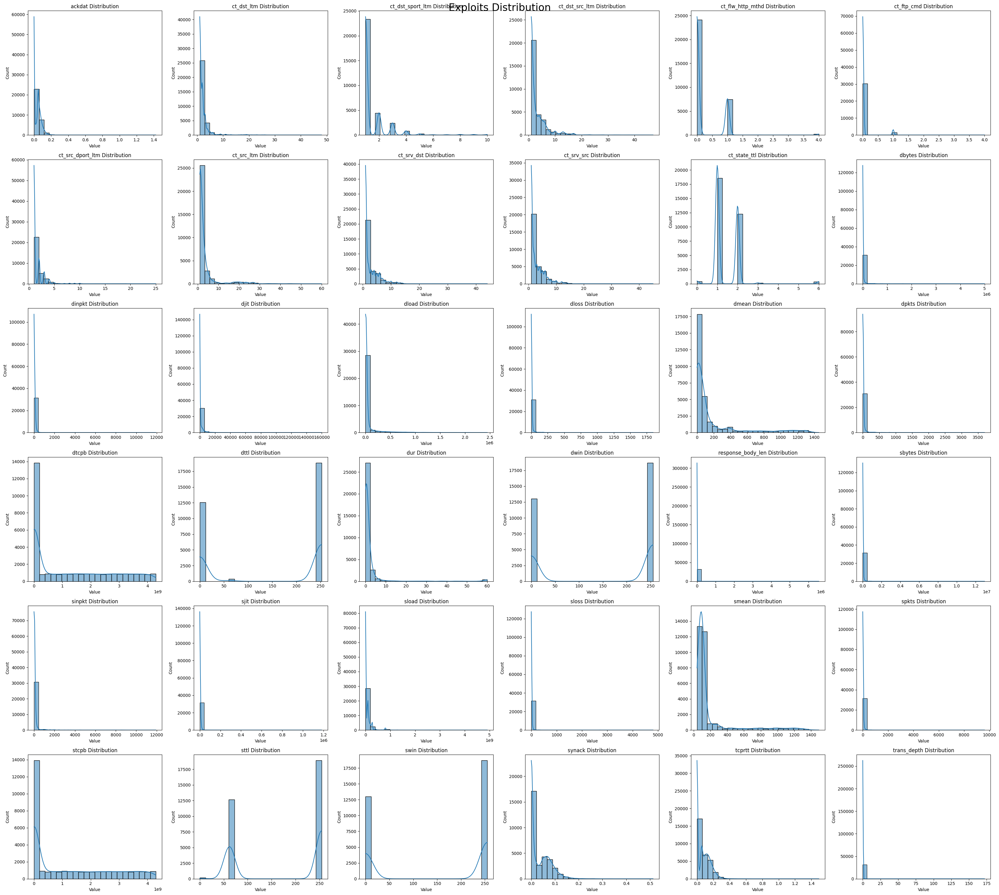

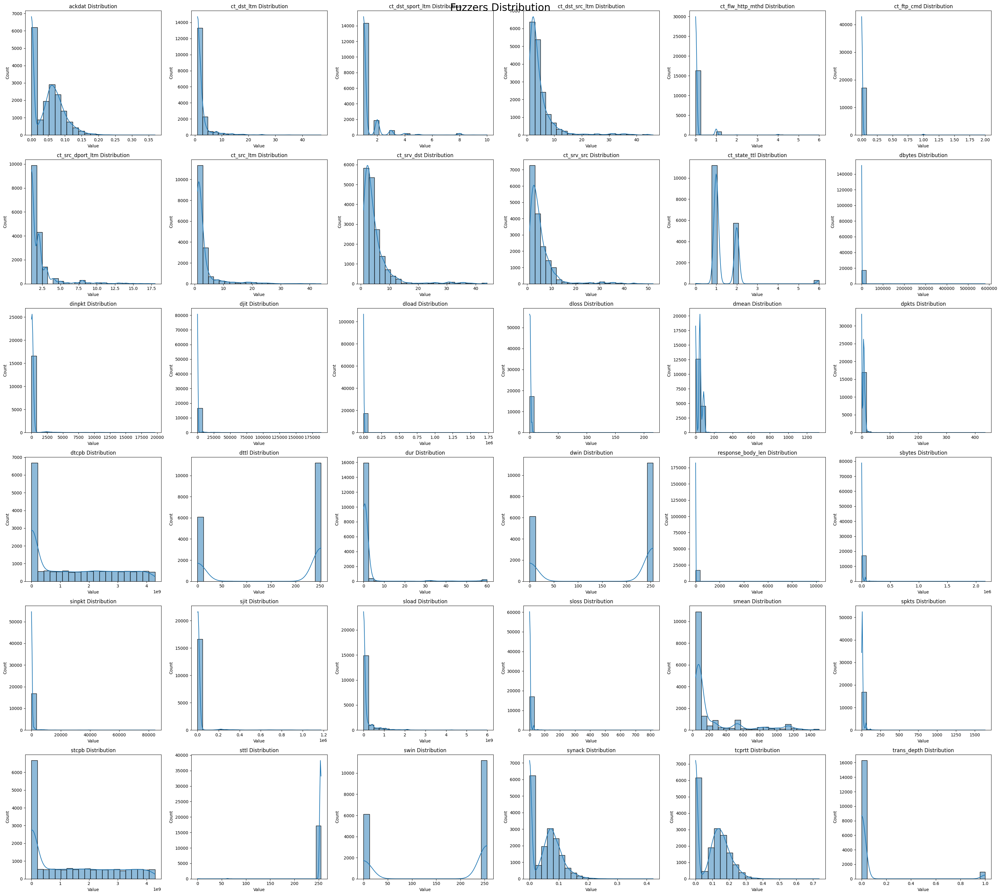

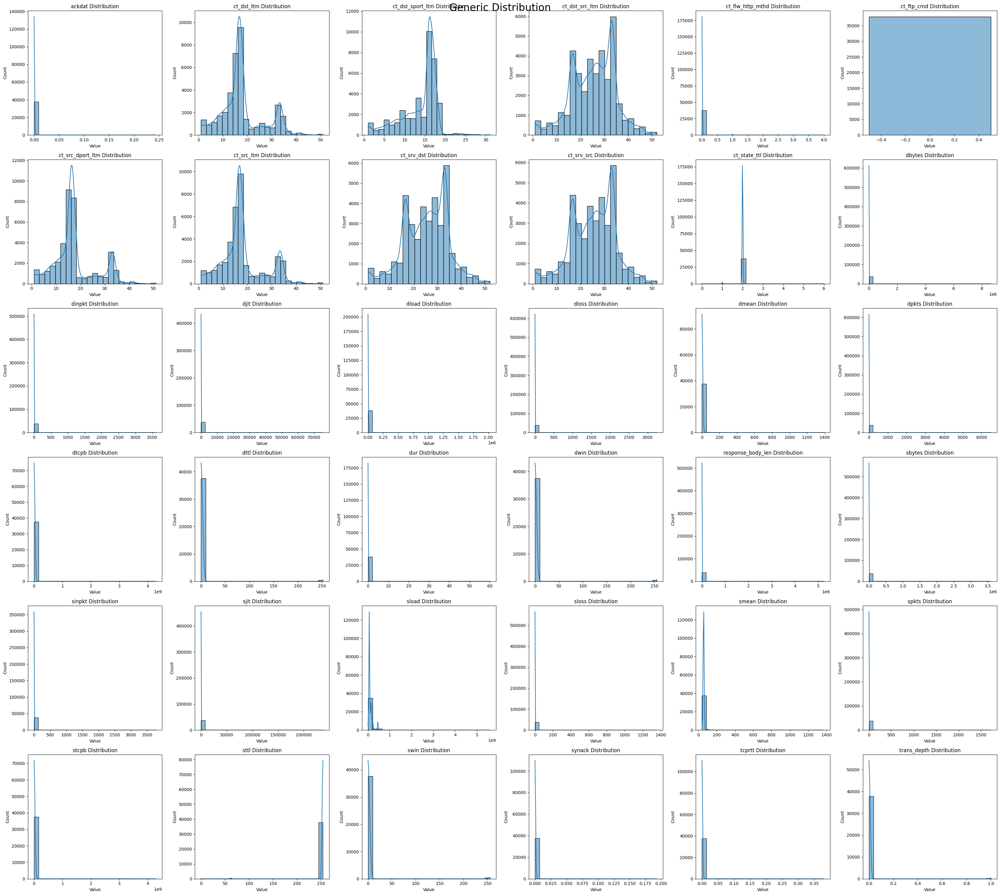

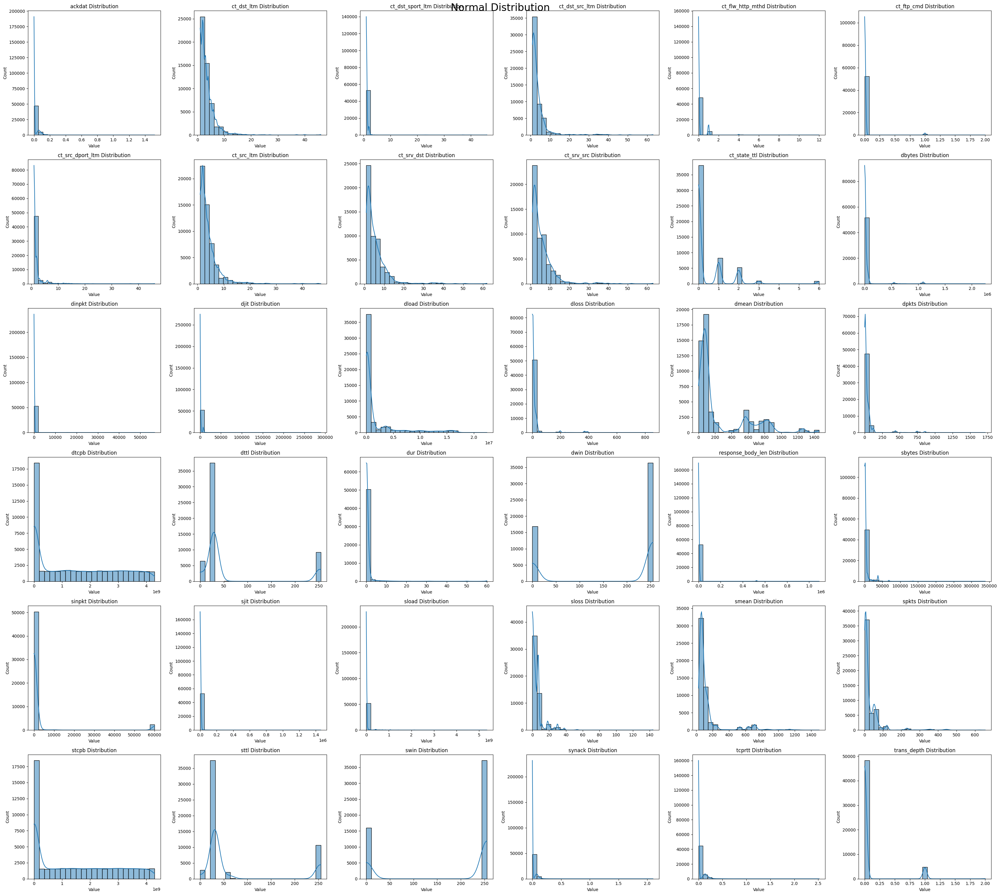

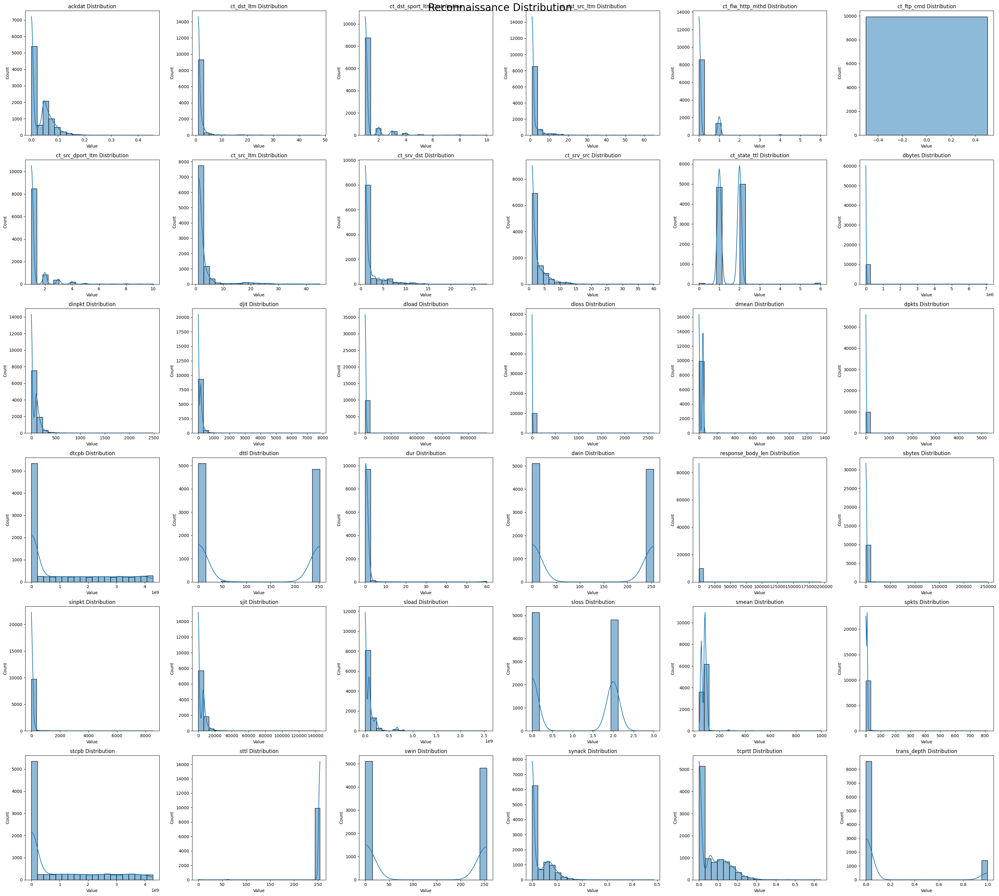

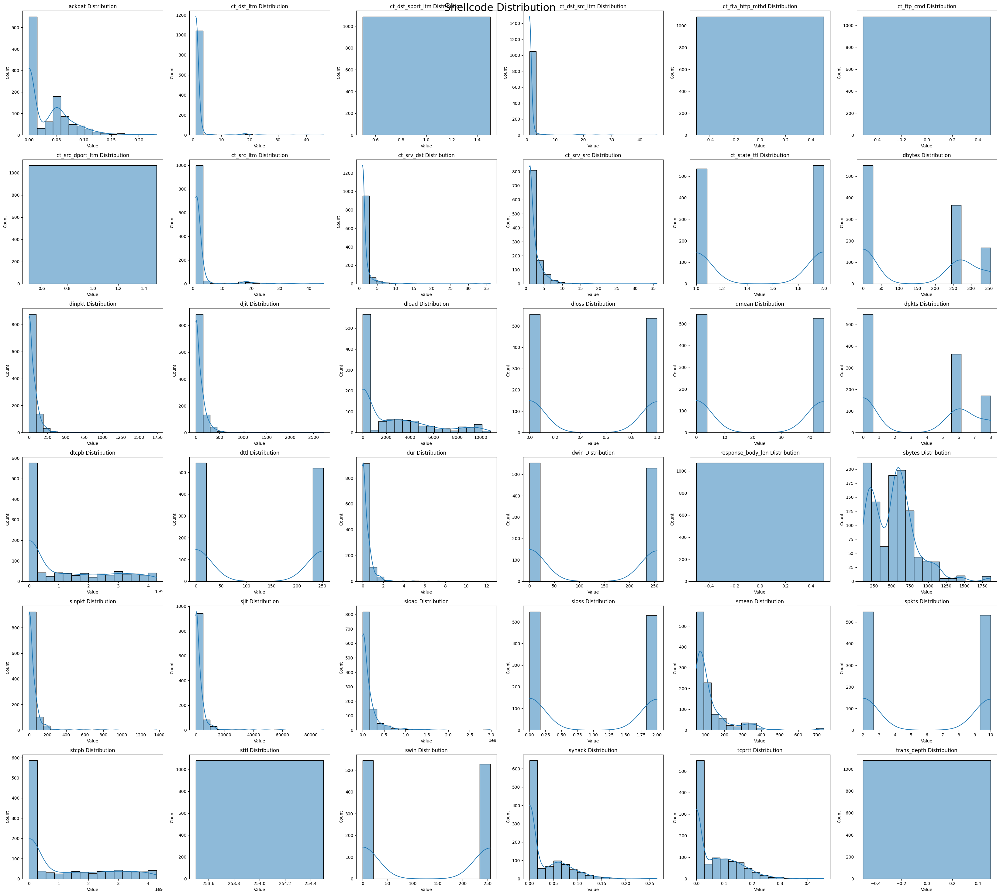

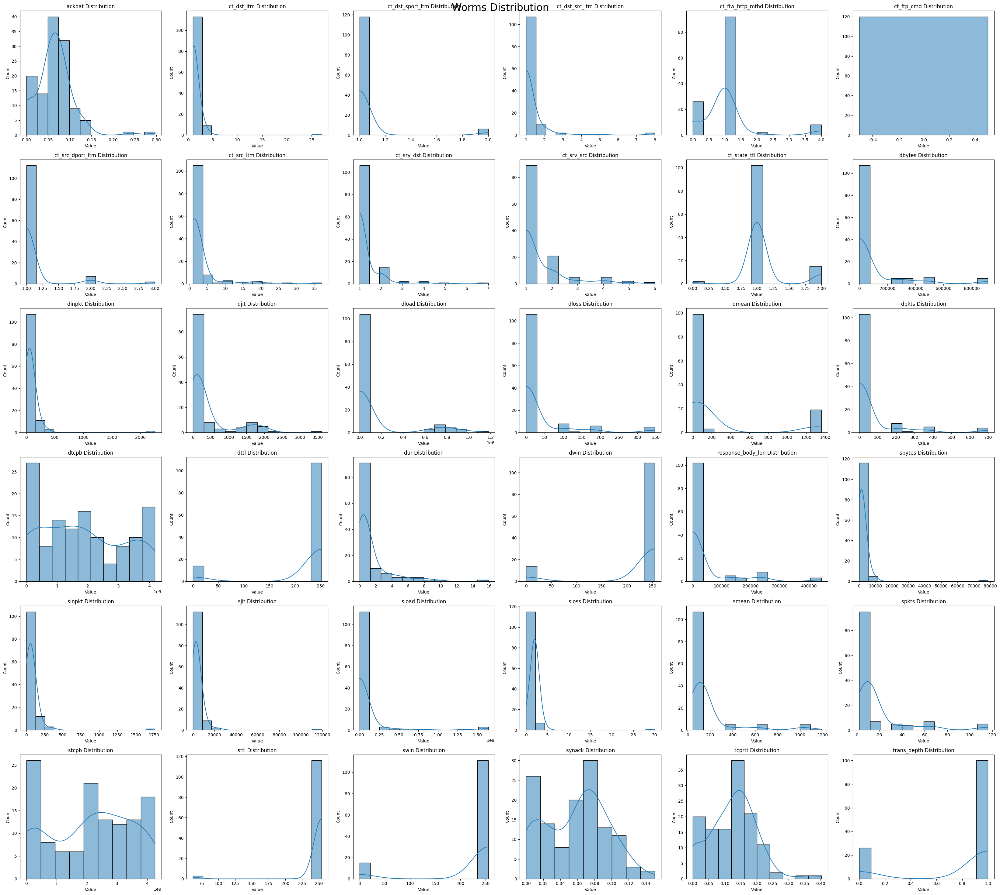

In [10]:
# Check the distribution of numerical features based on the target variable
for category in np.unique(train_set[target_variable]):
    subset = train_set[train_set[target_variable].eq(category).any(axis=1)]
    
    fig_cols = math.ceil((len(numerical_features))**(0.5))
    fig_rows = round((len(numerical_features))**(0.5))

    fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(fig_cols*5.5, fig_rows*5))

    axes = axes.flatten()

    # Iterate all over the subplots
    for i, column in enumerate(numerical_features):
        sns.histplot(subset[column], ax=axes[i], kde=True, bins='doane')
        axes[i].set_title(f"{column} Distribution")
        axes[i].set_xlabel("Value")

    # Hide any unused subplots
    for i in range(len(numerical_features), fig_rows * fig_cols):
        axes[i].axis('off')

    # Set the title
    fig.suptitle(f"{category} Distribution", fontsize=24)
    
    # Adjust the spacing between the subplots
    plt.tight_layout()

    # Show the plot
    plt.show()

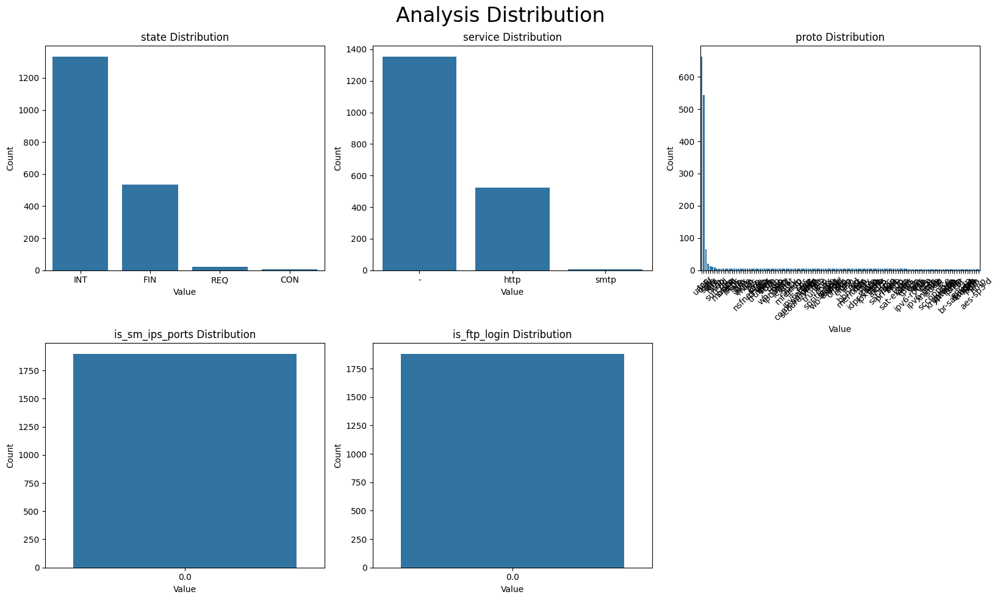

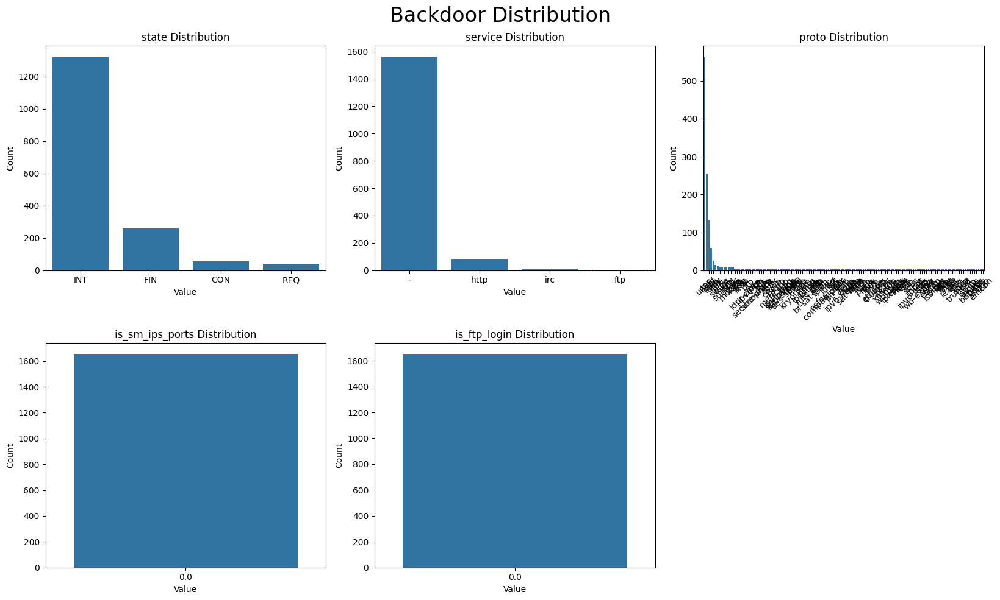

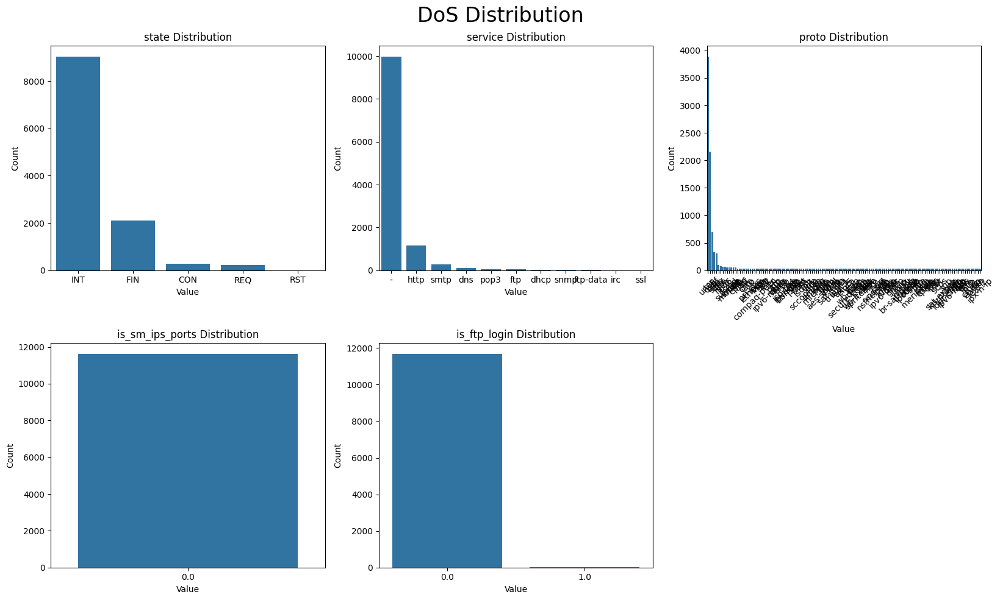

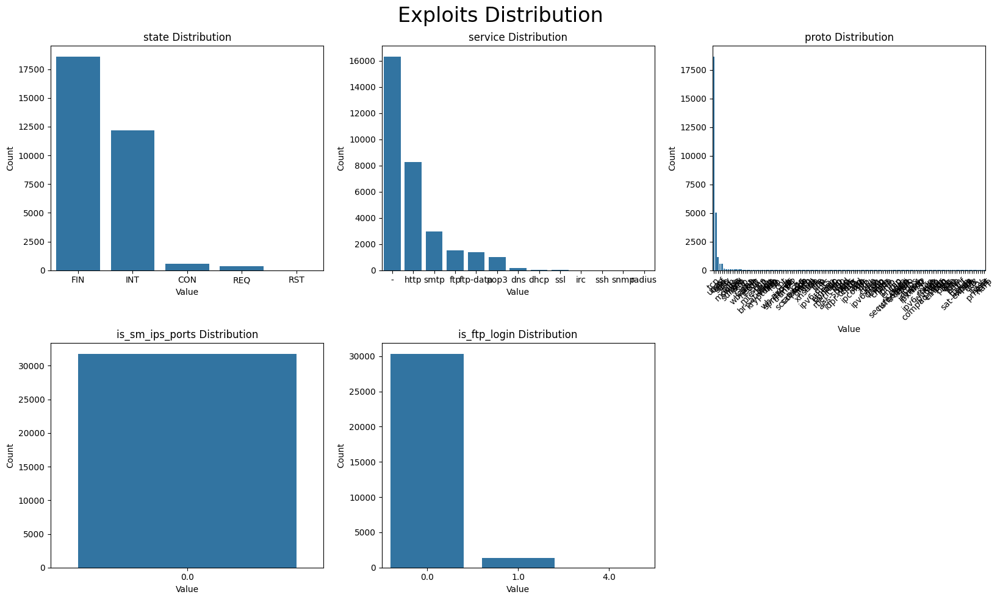

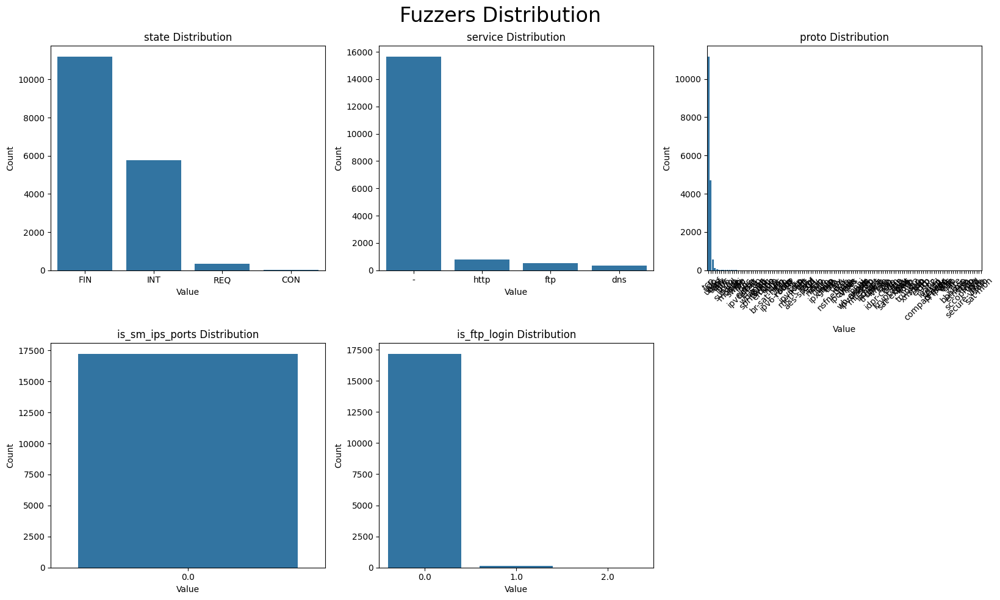

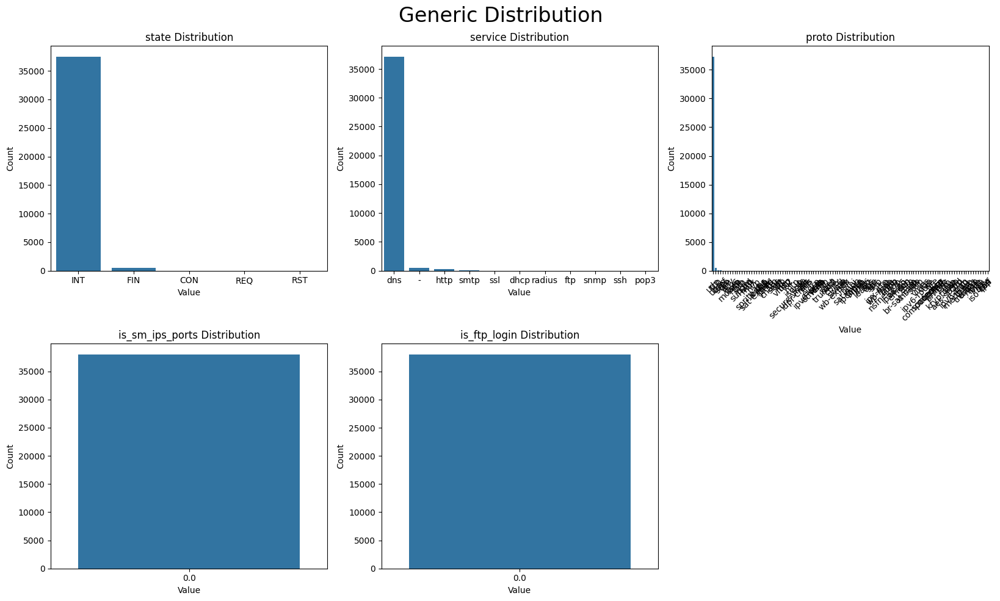

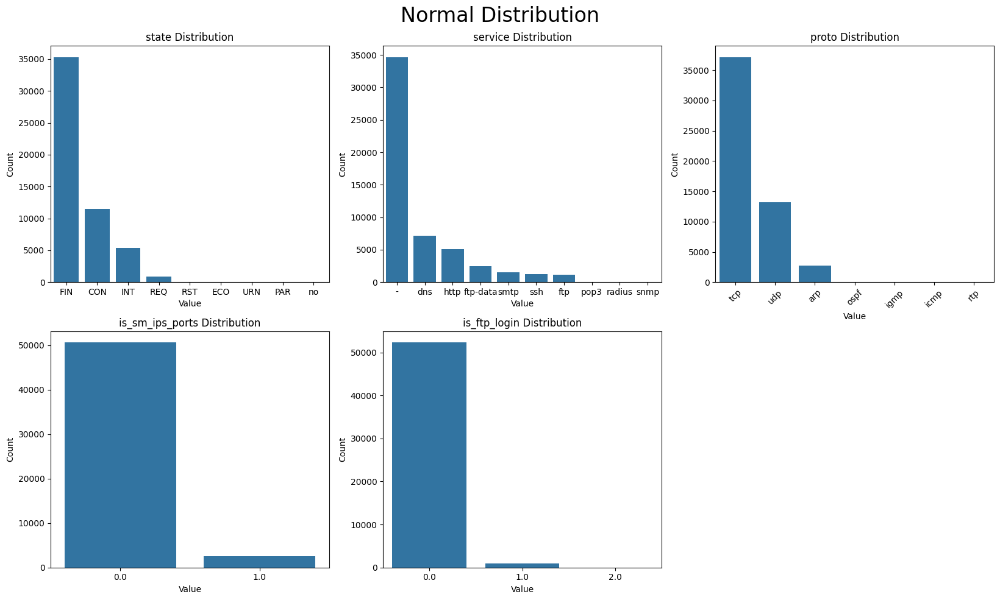

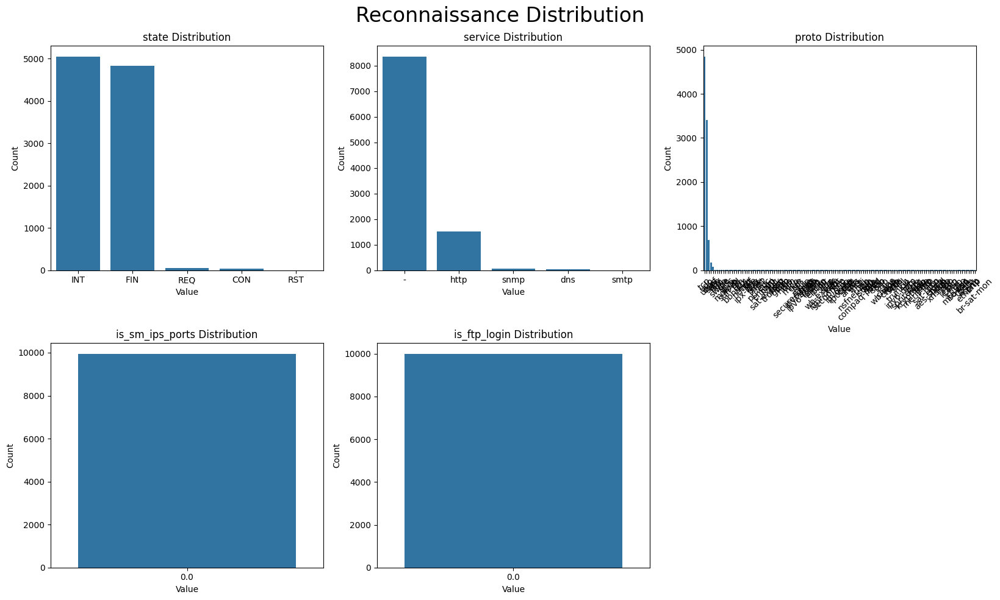

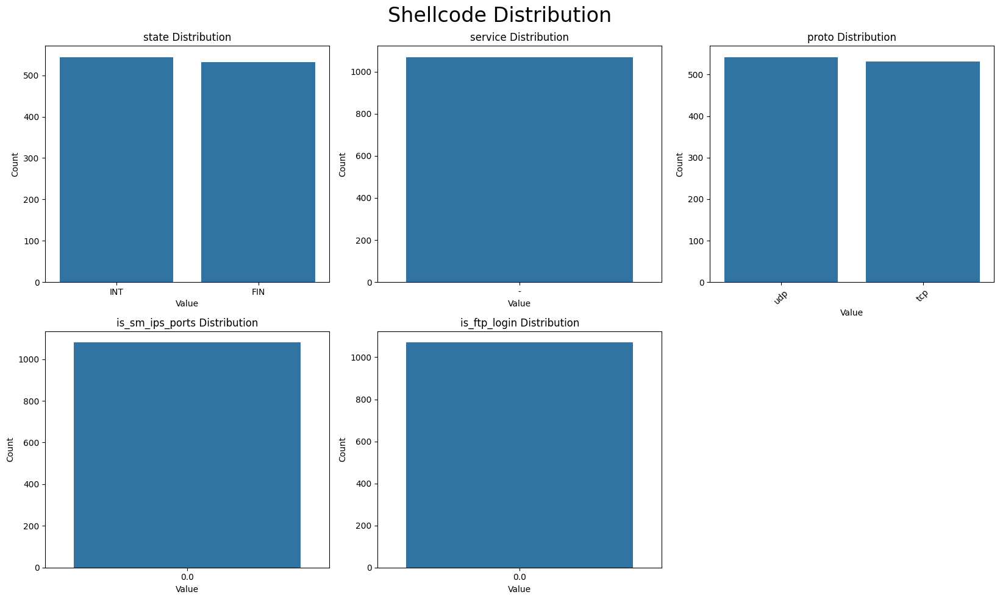

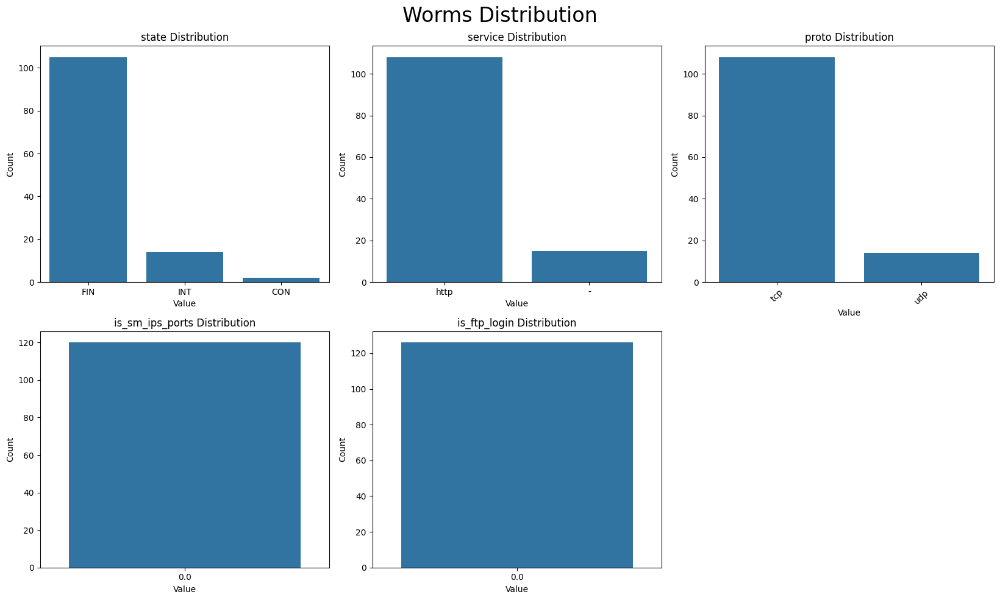

In [11]:
# Check the distribution of categorical features based on the target variable
for category in np.unique(train_set[target_variable]):
    subset = train_set[train_set[target_variable].eq(category).any(axis=1)]
    
    fig_cols = math.ceil((len(categorical_features))**(0.5))
    fig_rows = round((len(categorical_features))**(0.5))

    fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(fig_cols*5.5, fig_rows*5))

    axes = axes.flatten()

    # Iterate all over the subplots
    for i, column in enumerate(categorical_features):
        sns.countplot(x=column, data=subset, ax=axes[i], order=subset[column].value_counts().index)
        axes[i].set_title(f"{column} Distribution")
        axes[i].set_xlabel("Value")
        axes[i].set_ylabel("Count")

        if i==2:
            axes[i].tick_params(axis='x', rotation=45)

    # Hide any unused subplots
    for i in range(len(categorical_features), fig_rows * fig_cols):
        axes[i].axis('off')

    # Set the title
    fig.suptitle(f"{category} Distribution", fontsize=24)

    # Adjust the spacing between the subplots
    plt.tight_layout()

    # Show the plot
    plt.show()

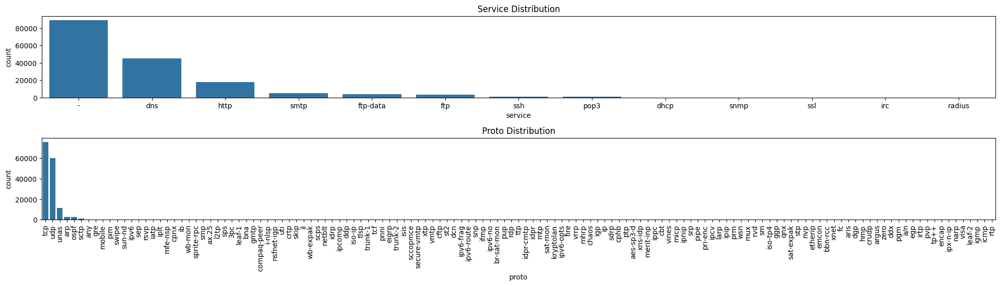

In [12]:
# Check the distribution of `service` and `proto` features with detailed information
fig, axes = plt.subplots(2, 1, figsize=(20, 5))

axes.flatten()

sns.countplot(x='service', data=train_set, ax=axes[0], order=train_set['service'].value_counts().index)
axes[0].set_title("Service Distribution")

sns.countplot(x='proto', data=train_set, ax=axes[1], order=train_set['proto'].value_counts().index)
axes[1].set_title("Proto Distribution")

plt.tight_layout()

axes[1].tick_params(axis='x', rotation=90)

In [13]:
# Get unique values of categorical features
for column in categorical_features:
    print(f"Unique values of {column}:", train_set[column].unique())

Unique values of state: ['FIN' 'INT' 'CON' nan 'REQ' 'ECO' 'RST' 'URN' 'PAR' 'no']
Unique values of service: ['-' 'dns' 'smtp' nan 'http' 'pop3' 'ftp' 'ssh' 'ftp-data' 'ssl' 'dhcp'
 'snmp' 'radius' 'irc']
Unique values of proto: ['tcp' 'udp' 'st2' 'unas' 'irtp' nan 'vmtp' 'any' 'cpnx' 'sctp' 'ospf'
 'fc' 'cftp' 'rsvp' 'aris' 'dgp' 'ipv6-route' 'snp' 'pnni' 'arp' 'cbt'
 'scps' 'tcf' 'leaf-1' 'swipe' 'wb-mon' 'crudp' 'sun-nd' 'rdp' 'gmtp'
 'ifmp' 'mobile' 'prm' 'sps' 'ipx-n-ip' 'ipip' 'ipv6-no' 'crtp' 'gre'
 'zero' 'hmp' 'trunk-1' 'idpr' 'ib' 'idpr-cmtp' 'vines' 'micp' 'a/n'
 'ipv6' 'narp' 'ttp' 'eigrp' 'uti' 'mux' 'pim' 'srp' 'wsn' 'tlsp' 'argus'
 '3pc' 'ax.25' 'ipnip' 'l2tp' 'skip' 'ipv6-frag' 'il' 'rvd' 'visa' 'xtp'
 'sm' 'xns-idp' 'ipv6-opts' 'encap' 'ippc' 'merit-inp' 'dcn' 'netblt'
 'bbn-rcc' 'emcon' 'nsfnet-igp' 'iso-tp4' 'ipcv' 'sat-mon' 'nvp' 'i-nlsp'
 'etherip' 'pvp' 'smp' 'idrp' 'ipcomp' 'mhrp' 'ddx' 'icmp' 'kryptolan'
 'tp++' 'aes-sp3-d' 'wb-expak' 'sprite-rpc' 'iso-ip' 'mtp'

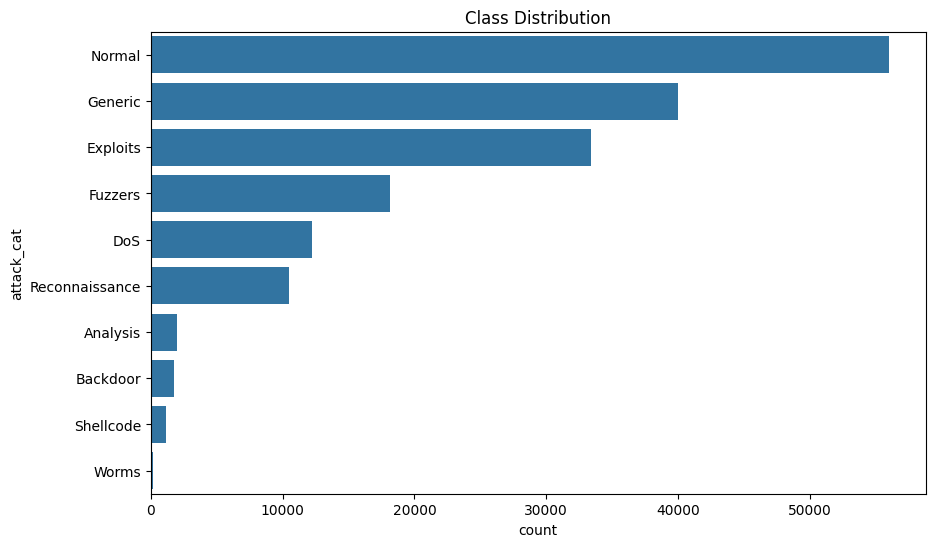

In [14]:
# Check the distribution of target variable
plt.figure(figsize=(10, 6))

sns.countplot(y='attack_cat', data=train_set, order=train_set['attack_cat'].value_counts().index)
plt.title('Class Distribution')

plt.show()

In [15]:
# Check missing values in the dataset
missing_values = train_set.isnull().sum()
missing_values

state                8805
dur                  8722
sbytes               8561
dbytes               8869
sttl                 8825
dttl                 8654
sloss                8794
dloss                8978
service              8791
sload                8786
dload                8837
spkts                8654
dpkts                8686
is_sm_ips_ports      8746
ct_state_ttl         8635
ct_flw_http_mthd     8647
is_ftp_login         8647
ct_ftp_cmd           8842
ct_srv_src           8851
ct_srv_dst           8774
ct_dst_ltm           8738
ct_src_ltm           8823
ct_src_dport_ltm     8775
ct_dst_sport_ltm     8788
ct_dst_src_ltm       8895
swin                 8740
dwin                 8779
stcpb                8672
dtcpb                8803
smean                8788
dmean                8855
trans_depth          8785
response_body_len    8791
sjit                 8738
djit                 8846
sinpkt               8707
dinpkt               8734
tcprtt               8836
synack      

In [16]:
# Make new column `indicate_missing` for each row that has missing values and set is as NaN if the value is missing
check_missing_train_set = train_set.copy()
check_missing_train_set['indicate_missing'] = check_missing_train_set.isnull().any(axis=1)
check_missing_train_set['indicate_missing'] = check_missing_train_set['indicate_missing'].replace({True: np.nan, False: 1})

C:\Users\hafiz\AppData\Local\Temp\ipykernel_24100\2411332299.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  check_missing_train_set['indicate_missing'] = check_missing_train_set['indicate_missing'].replace({True: np.nan, False: 1})


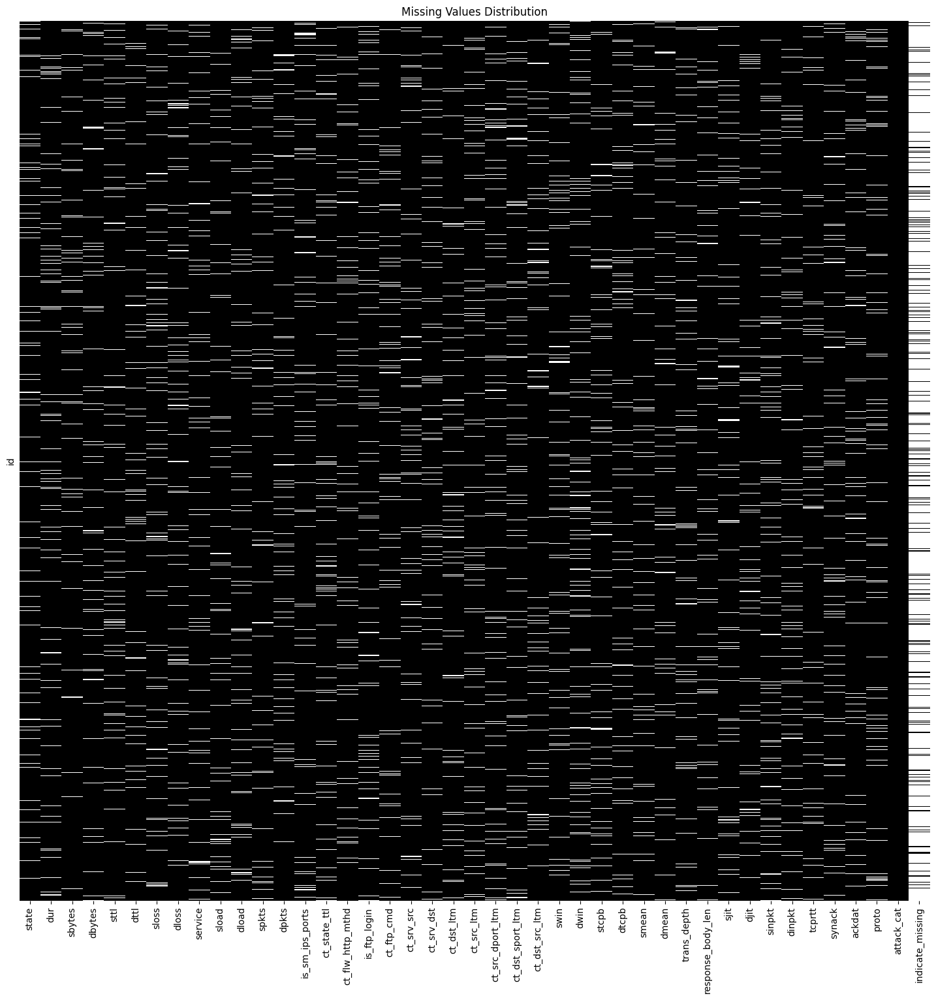

In [17]:
# Check missing values distribution using heatmap, grayscale color
plt.figure(figsize=(18, 17.5))

sns.heatmap(check_missing_train_set.isnull(), cmap='gray', cbar=False, yticklabels=False)
plt.title('Missing Values Distribution')
plt.show()

In [18]:
# Check rows with missing values based on the `attack_cat` column
attack_categories = train_set['attack_cat'].unique()

for attack_category in attack_categories:
    print(f"Attack Category: {attack_category}")
    
    missing_rows = check_missing_train_set[check_missing_train_set['attack_cat'] == attack_category]['indicate_missing'].isnull().sum()
    total_rows = check_missing_train_set[check_missing_train_set['attack_cat'] == attack_category].shape[0]
    
    print(f"Number of Rows with Missing Values: {missing_rows}/{total_rows} ({missing_rows/total_rows:.2%})")

Attack Category: Normal
Number of Rows with Missing Values: 49042/56000 (87.58%)
Attack Category: Generic
Number of Rows with Missing Values: 35106/40000 (87.77%)
Attack Category: Exploits
Number of Rows with Missing Values: 29351/33393 (87.90%)
Attack Category: Fuzzers
Number of Rows with Missing Values: 15988/18184 (87.92%)
Attack Category: DoS
Number of Rows with Missing Values: 10730/12264 (87.49%)
Attack Category: Reconnaissance
Number of Rows with Missing Values: 9297/10491 (88.62%)
Attack Category: Analysis
Number of Rows with Missing Values: 1784/2000 (89.20%)
Attack Category: Backdoor
Number of Rows with Missing Values: 1534/1746 (87.86%)
Attack Category: Shellcode
Number of Rows with Missing Values: 980/1133 (86.50%)
Attack Category: Worms
Number of Rows with Missing Values: 114/130 (87.69%)


In [19]:
# Check for duplicated rows in the dataset
duplicated_rows = train_set.duplicated().sum()
duplicated_rows

np.int64(5756)

In [20]:
# Check for outlier in the dataset
for column in numerical_features:
    Q1 = train_set[column].quantile(0.25)
    Q3 = train_set[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = train_set[(train_set[column] < lower_bound) | (train_set[column] > upper_bound)]
    outliers_sorted = outliers.sort_values(by=column)

    print(f"Outliers of {column} feature: {outliers.shape[0]} instances")
    if outliers.shape[0]:
        print(f"Few extreme instances:")
        display(pd.concat([outliers_sorted.head()[0:2], outliers_sorted.tail()[3:]]))
    print("")

Outliers of ackdat feature: 7878 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
8423,FIN,1.369859,1008.0,60523.0,62.0,252.0,2.0,23.0,http,5518.816406,...,29015.0,5774.528690,NaN,91.257398,26.480042,0.169713,0.072335,0.097378,tcp,DoS
129324,FIN,0.849424,804.0,1380.0,62.0,252.0,2.0,2.0,http,6818.738281,...,245.0,5210.142833,156.761687,94.380444,83.054219,0.198564,NaN,0.097394,tcp,Normal
95127,CON,2.347377,978.0,86.0,62.0,252.0,2.0,1.0,-,2777.568359,...,NaN,29288.699340,0.000000,469.475400,0.001000,2.049806,0.549954,1.499852,tcp,Normal
82814,CON,1.983542,978.0,86.0,62.0,252.0,2.0,1.0,-,3287.049072,...,0.0,24252.222980,0.000000,396.708400,NaN,1.689777,0.168893,1.520884,tcp,Normal



Outliers of ct_dst_ltm feature: 21021 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
175022,INT,0.000005,114.0,0.0,254.0,0.0,0.0,0.0,dns,91200000.0,...,0.0,0.0,0.0,0.005,0.0,NaN,0.0,0.0,udp,Generic
175011,INT,0.000006,114.0,0.0,254.0,0.0,0.0,0.0,dns,76000000.0,...,0.0,0.0,0.0,0.006,0.0,NaN,0.0,0.0,udp,Generic
147167,NaN,0.000008,114.0,0.0,254.0,0.0,0.0,0.0,dns,57000000.0,...,0.0,0.0,0.0,0.008,0.0,0.0,0.0,0.0,udp,Generic
42570,INT,0.000008,114.0,NaN,254.0,0.0,0.0,0.0,dns,57000000.0,...,0.0,0.0,0.0,0.008,0.0,0.0,0.0,0.0,udp,Generic



Outliers of ct_dst_sport_ltm feature: 35385 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
114321,INT,0.000009,114.0,0.0,254.0,0.0,0.0,0.0,dns,50666664.0,...,0.0,0.0,0.0,0.009,0.0,0.0,NaN,0.0,udp,Generic
57471,INT,0.000001,114.0,0.0,254.0,0.0,0.0,0.0,dns,456000000.0,...,0.0,0.0,0.0,0.001,0.0,0.0,0.0,0.0,udp,Generic
171617,INT,0.000108,503.0,0.0,64.0,0.0,0.0,0.0,-,18666666.0,...,0.0,NaN,0.0,0.108,0.0,0.0,0.0,0.0,udp,Normal
107732,INT,0.000108,503.0,0.0,64.0,0.0,0.0,0.0,-,NaN,...,0.0,0.0,0.0,0.108,0.0,0.0,0.0,0.0,udp,Normal



Outliers of ct_dst_src_ltm feature: 16832 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
137661,INT,0.000008,114.0,0.0,254.0,0.0,0.0,0.0,dns,5.700000e+07,...,0.0,0.000000,0.000000,0.008000,0.0,0.00000,0.000000,0.000000,udp,Generic
151374,INT,0.000010,114.0,0.0,254.0,0.0,0.0,0.0,dns,NaN,...,0.0,0.000000,0.000000,0.010000,0.0,0.00000,0.000000,0.000000,udp,Generic
21007,INT,0.000011,1646.0,0.0,254.0,NaN,0.0,0.0,-,5.985455e+08,...,0.0,0.000000,NaN,0.011000,0.0,0.00000,0.000000,0.000000,udp,Normal
111393,FIN,0.693665,564.0,354.0,254.0,252.0,2.0,1.0,-,5.858736e+03,...,0.0,5923.589262,136.861938,76.244667,NaN,0.09727,0.051645,0.045625,tcp,Reconnaissance



Outliers of ct_flw_http_mthd feature: 16996 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
175327,FIN,0.034146,1032.0,822.0,31.0,NaN,NaN,2.0,http,211562.125000,...,82.0,281.178581,6.995774,4.826429,3.736111,0.000665,0.000518,NaN,tcp,Normal
175072,FIN,0.835295,1048.0,50403.0,62.0,252.0,2.0,20.0,http,9414.637695,...,24064.0,2988.310700,1958.543482,55.686332,17.990419,0.100789,0.041918,0.058871,tcp,Exploits
1714,FIN,0.644097,806.0,1266.0,62.0,252.0,2.0,2.0,NaN,9017.275391,...,156.0,3593.980389,127.018133,71.566333,77.309859,0.209047,0.085835,0.123212,tcp,Analysis
44450,FIN,38.604820,1636.0,2428.0,62.0,252.0,4.0,6.0,http,322.239563,...,156.0,272579.600300,9364.471000,2031.832579,2568.358250,0.184736,0.078627,0.106109,tcp,Analysis



Outliers of ct_ftp_cmd feature: 2443 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
1759,FIN,0.841598,2934.0,3742.0,31.0,29.0,11.0,15.0,ftp,27357.480470,...,0.0,1412.526078,52.661574,16.495745,15.869773,0.000635,0.000496,0.000139,tcp,Normal
173989,FIN,2.241779,2934.0,3742.0,31.0,29.0,11.0,15.0,ftp,10270.414060,...,0.0,2956.005541,91.122797,44.829260,42.287359,0.000715,NaN,0.000169,tcp,Normal
96602,CON,2.349103,690.0,1038.0,62.0,252.0,5.0,6.0,NaN,2182.960938,...,0.0,9278.627855,217.442547,180.700231,154.221469,0.228658,0.058391,0.170267,tcp,Exploits
151392,CON,2.349103,690.0,1038.0,62.0,252.0,5.0,6.0,ftp,2182.960938,...,0.0,9278.627855,217.442547,180.700231,154.221469,0.228658,0.058391,0.170267,tcp,Exploits



Outliers of ct_src_dport_ltm feature: 31801 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
175014,INT,0.000009,114.0,NaN,254.0,0.0,0.0,0.0,dns,50666664.0,...,0.0,0.0,0.0,0.009,0.0,0.0,0.0,0.0,udp,Generic
174971,INT,0.000003,114.0,0.0,254.0,0.0,0.0,0.0,dns,152000000.0,...,0.0,0.0,0.0,0.003,0.0,0.0,0.0,0.0,udp,Generic
22832,INT,0.000003,114.0,0.0,254.0,0.0,0.0,0.0,dns,152000000.0,...,0.0,0.0,0.0,0.003,0.0,NaN,0.0,NaN,udp,Generic
32617,INT,0.000007,114.0,0.0,254.0,0.0,0.0,0.0,dns,65142856.0,...,0.0,0.0,0.0,0.007,0.0,0.0,0.0,0.0,udp,Generic



Outliers of ct_src_ltm feature: 12487 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
285,INT,0.000009,200.0,0.0,NaN,0.0,0.0,0.0,-,8.888889e+07,...,NaN,0.000000,0.0,0.009000,0.000000,0.000000,0.000000,0.000000,unas,Exploits
174060,INT,0.000009,114.0,0.0,254.0,0.0,0.0,0.0,dns,5.066666e+07,...,0.0,0.000000,NaN,0.009000,0.000000,0.000000,0.000000,0.000000,udp,Generic
166572,INT,0.000008,114.0,0.0,254.0,0.0,0.0,0.0,dns,5.700000e+07,...,0.0,0.000000,0.0,0.008000,0.000000,0.000000,0.000000,0.000000,udp,Generic
25332,FIN,0.470980,868.0,18818.0,NaN,252.0,2.0,8.0,http,1.352074e+04,...,8704.0,3080.715988,0.0,42.816362,19.990952,0.098753,0.050647,0.048106,tcp,Exploits



Outliers of ct_srv_dst feature: 18380 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
71916,INT,0.000004,114.0,0.0,254.0,0.0,0.0,0.0,dns,114000000.0,...,0.0,0.0,0.0,0.004,0.0,0.0,0.0,0.0,udp,Generic
71859,INT,0.000002,114.0,0.0,254.0,0.0,0.0,0.0,dns,228000000.0,...,0.0,0.0,0.0,0.002,0.0,0.0,0.0,0.0,udp,Generic
140724,NaN,0.000010,1502.0,0.0,254.0,0.0,0.0,0.0,-,600800000.0,...,0.0,0.0,0.0,0.010,0.0,0.0,0.0,0.0,udp,Normal
95803,INT,0.000012,1774.0,NaN,254.0,0.0,0.0,0.0,-,591333312.0,...,0.0,NaN,0.0,0.012,0.0,0.0,0.0,0.0,udp,Normal



Outliers of ct_srv_src feature: 18379 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
167,INT,0.000004,114.0,0.0,254.0,0.0,0.0,0.0,dns,114000000.0,...,0.0,0.0,NaN,0.004,0.0,0.0,0.0,0.0,udp,Generic
113451,INT,0.000009,114.0,0.0,254.0,0.0,0.0,0.0,dns,50666664.0,...,0.0,0.0,0.0,0.009,0.0,0.0,0.0,0.0,udp,Generic
5434,INT,0.000009,290.0,0.0,254.0,0.0,0.0,0.0,-,128888888.0,...,0.0,0.0,0.0,0.009,NaN,0.0,NaN,0.0,udp,Normal
89610,INT,0.000011,1154.0,0.0,254.0,0.0,0.0,0.0,-,419636352.0,...,0.0,0.0,0.0,0.011,NaN,0.0,0.0,0.0,udp,Normal



Outliers of ct_state_ttl feature: 1838 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
173934,REQ,59.400505,17408.0,0.0,254.0,0.0,0.0,0.0,-,2.307859e+03,...,0.0,1174.328750,0.0,954.815563,NaN,NaN,0.0,0.0,ospf,Exploits
173833,REQ,21.031204,1728.0,0.0,254.0,0.0,0.0,0.0,-,6.162272e+02,...,0.0,1604.459625,0.0,1513.802500,0.0,0.0,0.0,0.0,ospf,DoS
175275,REQ,58.881458,18496.0,0.0,254.0,0.0,0.0,0.0,-,2.476026e+03,...,0.0,1146.884250,0.0,919.770813,0.0,0.0,0.0,0.0,ospf,Exploits
78,REQ,0.000003,90.0,0.0,254.0,0.0,1.0,0.0,-,1.200000e+08,...,0.0,0.000000,0.0,0.003000,0.0,0.0,0.0,NaN,NaN,Normal



Outliers of dbytes feature: 26698 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
125778,FIN,4.061115,187303.0,2742.0,62.0,252.0,76.0,8.0,smtp,366634.312500,...,0.0,2939.929523,138.459703,25.866975,NaN,0.128513,0.091870,0.036643,tcp,Exploits
153392,FIN,2.143405,5738.0,2742.0,254.0,252.0,4.0,2.0,http,20080.199220,...,900.0,7944.594778,NaN,142.893668,223.710672,0.214697,0.105681,0.109016,tcp,Exploits
5616,CON,59.962872,70506.0,14491793.0,62.0,252.0,6.0,5425.0,pop3,9400.883789,...,0.0,2449.349956,977.177980,NaN,NaN,0.051143,0.006777,NaN,tcp,DoS
78647,FIN,57.953392,71234.0,14655550.0,62.0,252.0,7.0,5484.0,pop3,9827.345703,...,0.0,2261.975564,872.193752,35.059465,5.285939,0.053858,0.008257,0.045601,tcp,DoS



Outliers of dinpkt feature: 13409 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
29746,FIN,0.710078,490.0,268.0,254.0,252.0,2.0,1.0,-,4968.468262,...,0.0,4.363701e+03,210.146094,76.736222,127.336398,0.170587,0.073388,0.097199,tcp,Fuzzers
144433,FIN,1.235915,786.0,3406.0,62.0,252.0,2.0,3.0,http,4582.839844,...,1243.0,7.954832e+03,9519.526611,134.582444,127.337111,0.165679,0.089876,0.075803,tcp,Exploits
10427,CON,0.634207,986.0,86.0,62.0,252.0,4.0,2.0,-,10368.854490,...,0.0,1.460480e+06,NaN,18961.849170,56716.824000,0.159277,0.078631,0.080646,tcp,Normal
57974,CON,0.634207,NaN,86.0,62.0,252.0,4.0,2.0,-,10368.854490,...,0.0,1.460480e+06,56716.824000,18961.849170,56716.824000,0.159277,0.078631,0.080646,tcp,Normal



Outliers of djit feature: 19538 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
166392,FIN,1.509184,1130.0,742.0,254.0,252.0,3.0,2.0,-,5565.921875,...,0.0,6494.899949,286.915062,116.022310,196.991578,0.253378,0.130234,0.123144,tcp,Fuzzers
42725,FIN,0.984462,2516.0,268.0,254.0,252.0,2.0,1.0,-,18405.992190,...,0.0,5886.037280,286.945125,105.431333,177.477406,NaN,0.097066,0.051226,tcp,Normal
118899,FIN,37.767029,1684.0,10168.0,31.0,29.0,3.0,5.0,http,331.294250,...,3924.0,318704.705600,287289.700800,2905.059077,2360.402906,0.000731,0.000572,0.000159,tcp,Normal
117343,FIN,39.359058,1684.0,10168.0,31.0,29.0,3.0,5.0,http,317.893799,...,3924.0,330903.305800,289388.269700,3027.594077,2315.205882,0.000704,0.000550,0.000154,tcp,Normal



Outliers of dload feature: 36132 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
102156,FIN,0.327122,4616.0,2976.0,31.0,29.0,7.0,7.0,-,108876.81250,...,0.0,732.506823,19.623592,12.104074,12.094296,0.000713,0.000573,0.000140,tcp,Normal
40169,FIN,1.094599,1684.0,10168.0,31.0,29.0,3.0,5.0,http,11430.66992,...,3924.0,8800.347447,7705.824859,84.173231,64.353529,0.000729,0.000584,0.000145,tcp,Normal
2074,FIN,0.002895,320.0,8824.0,31.0,NaN,1.0,4.0,ftp-data,737823.87500,...,0.0,29.033056,16.212153,NaN,0.218909,0.000611,0.000484,0.000127,tcp,Normal
69913,NaN,0.002886,320.0,NaN,31.0,29.0,1.0,4.0,ftp-data,740124.68750,...,0.0,29.009743,0.000000,0.514400,0.219000,0.000600,0.000474,NaN,tcp,Normal



Outliers of dloss feature: 26996 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
88253,FIN,0.056030,2062.0,2308.0,31.0,29.0,6.0,6.0,-,282277.343800,...,0.0,244.118590,7.372307,2.421391,2.522773,NaN,0.000525,0.000434,tcp,Normal
23,FIN,0.083126,2054.0,2478.0,31.0,29.0,6.0,6.0,-,188725.546900,...,0.0,387.589833,370.712767,3.942190,3.589000,NaN,0.000574,0.000122,NaN,Normal
5616,CON,59.962872,70506.0,14491793.0,62.0,252.0,6.0,5425.0,pop3,9400.883789,...,0.0,2449.349956,977.177980,NaN,NaN,0.051143,0.006777,NaN,tcp,DoS
78647,FIN,57.953392,71234.0,14655550.0,62.0,252.0,7.0,5484.0,pop3,9827.345703,...,0.0,2261.975564,872.193752,35.059465,5.285939,0.053858,0.008257,0.045601,tcp,DoS



Outliers of dmean feature: 22185 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
101260,FIN,0.436542,NaN,2230.0,254.0,252.0,3.0,3.0,NaN,21642.820310,...,403.0,2011.669422,64.835707,39.685638,NaN,0.074320,0.023297,0.051023,tcp,DoS
7435,FIN,0.845628,364.0,1780.0,62.0,252.0,1.0,NaN,ftp-data,3017.875488,...,0.0,8005.765295,217.871656,120.804000,108.344141,0.145341,0.086474,0.058867,tcp,Exploits
165002,FIN,1.294682,19826.0,1087890.0,31.0,29.0,2.0,370.0,http,122179.804700,...,524288.0,184.862038,106.357804,3.498276,1.737203,0.000588,0.000462,0.000126,tcp,Normal
175173,FIN,52.924782,18682.0,1087900.0,31.0,29.0,2.0,370.0,http,2815.920898,...,524288.0,8578.045836,5783.954683,151.646041,71.134732,0.000656,0.000512,0.000144,tcp,Normal



Outliers of dpkts feature: 19752 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
96369,FIN,0.164818,3728.0,5578.0,31.0,29.0,7.0,7.0,ssh,175320.656300,...,0.0,412.406326,12.998978,5.316709,NaN,0.000662,0.000533,0.000129,tcp,Normal
96597,NaN,NaN,3728.0,5578.0,31.0,29.0,7.0,7.0,ssh,34573.859380,...,0.0,1784.336177,53.403391,26.960516,33.401680,0.000883,0.000610,0.000273,tcp,Normal
5616,CON,59.962872,70506.0,14491793.0,62.0,252.0,6.0,5425.0,pop3,9400.883789,...,0.0,2449.349956,977.177980,NaN,NaN,0.051143,0.006777,NaN,tcp,DoS
78647,FIN,57.953392,71234.0,14655550.0,62.0,252.0,7.0,5484.0,pop3,9827.345703,...,0.0,2261.975564,872.193752,35.059465,5.285939,0.053858,0.008257,0.045601,tcp,DoS



Outliers of dtcpb feature: 0 instances

Outliers of dttl feature: 0 instances

Outliers of dur feature: 14968 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
7251,FIN,1.668279,104600.0,NaN,254.0,252.0,40.0,1.0,-,495763.593800,...,0.0,2826.934794,203.033062,19.631309,93.683648,0.131069,0.075647,0.055422,tcp,Fuzzers
63827,FIN,1.668570,564.0,354.0,254.0,252.0,2.0,1.0,NaN,2435.618408,...,0.0,11107.671470,311.390125,177.032889,223.060578,0.207219,0.107145,0.100074,tcp,Reconnaissance
60924,INT,59.999989,NaN,0.0,0.0,0.0,0.0,0.0,-,6.133335,...,0.0,0.000000,0.000000,60000.640000,0.000000,0.000000,0.000000,0.000000,arp,Normal
1084,INT,59.999989,92.0,0.0,0.0,0.0,0.0,0.0,-,6.133335,...,0.0,0.000000,0.000000,60000.640000,0.000000,0.000000,0.000000,0.000000,arp,Normal



Outliers of dwin feature: 0 instances

Outliers of response_body_len feature: 10723 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
36875,FIN,0.418490,1150.0,1114.0,62.0,252.0,3.0,3.0,http,20167.746090,...,3.0,1879.156018,60.026203,38.044547,45.152445,0.058905,0.011379,NaN,tcp,Backdoor
93682,FIN,0.339120,1144.0,1116.0,62.0,252.0,3.0,3.0,http,NaN,...,4.0,1642.979158,55.591324,30.829092,NaN,0.051926,0.006934,0.044992,tcp,Backdoor
91885,FIN,48.415607,NaN,4352433.0,62.0,252.0,0.0,1601.0,http,3758.622559,...,6558056.0,103.307602,1754.115784,91.731492,NaN,0.355996,0.170582,0.185414,tcp,Exploits
161403,CON,59.980652,23958.0,4166606.0,62.0,252.0,2.0,1517.0,http,3189.695312,...,6558056.0,6547.498274,2751.110540,110.056239,19.705549,0.355996,NaN,0.185414,tcp,Exploits



Outliers of sbytes feature: 21760 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
89630,FIN,4.577106,3377.0,1852.0,62.0,252.0,8.0,8.0,smtp,5.676950e+03,...,0.0,9433.844286,262.503031,183.084239,207.583719,0.361808,0.214289,0.147519,tcp,Exploits
41631,FIN,0.810124,3378.0,728.0,254.0,252.0,3.0,2.0,-,3.058297e+04,...,0.0,4159.572607,143.788531,70.194185,107.508430,0.122542,0.057556,0.064986,tcp,Fuzzers
56105,CON,59.983932,12594395.0,60802.0,254.0,252.0,4745.0,0.0,smtp,1.679526e+06,...,0.0,848.991373,54.843438,6.351218,42.609344,0.102509,NaN,0.052343,tcp,Exploits
134568,CON,59.970360,12965233.0,62436.0,254.0,252.0,4803.0,0.0,smtp,1.729372e+06,...,0.0,852.144741,53.046773,6.250384,41.366730,0.039941,0.020937,0.019004,tcp,Exploits



Outliers of sinpkt feature: 14034 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
60804,FIN,1.242093,840.0,5890.0,62.0,252.0,2.0,3.0,http,4869.200684,...,2490.0,8204.115494,10758.4558,138.010333,130.568778,0.146001,0.065717,0.080284,tcp,Exploits
58397,FIN,1.242093,840.0,5890.0,62.0,252.0,2.0,3.0,http,4869.200684,...,2490.0,8204.115494,10758.4558,138.010333,130.568778,0.146001,0.065717,0.080284,tcp,Exploits
163446,INT,0.000000,46.0,0.0,0.0,0.0,0.0,0.0,-,0.000000,...,0.0,0.000000,0.0000,60009.920000,0.000000,0.000000,0.000000,0.000000,arp,Normal
77420,REQ,0.000000,1504.0,0.0,255.0,0.0,0.0,0.0,-,0.000000,...,0.0,12.990111,NaN,84371.496000,0.000000,0.000000,0.000000,0.000000,udp,Fuzzers



Outliers of sjit feature: 17146 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
153071,FIN,1.025679,806.0,3040.0,62.0,NaN,2.0,2.0,http,5662.590332,...,0.0,6.278419e+03,231.201781,113.945111,117.609125,0.141217,0.084789,0.056428,tcp,Exploits
108388,REQ,13.318606,180.0,0.0,254.0,0.0,3.0,0.0,-,NaN,...,NaN,6.278444e+03,0.000000,4439.535500,0.000000,0.000000,0.000000,0.000000,tcp,Normal
57974,CON,0.634207,NaN,86.0,62.0,252.0,4.0,2.0,-,10368.854490,...,0.0,1.460480e+06,56716.824000,18961.849170,56716.824000,0.159277,0.078631,0.080646,tcp,Normal
10427,CON,0.634207,986.0,86.0,62.0,252.0,4.0,2.0,-,10368.854490,...,0.0,1.460480e+06,NaN,18961.849170,56716.824000,0.159277,0.078631,0.080646,tcp,Normal



Outliers of sload feature: 12843 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
143993,INT,0.000009,500.0,0.0,254.0,NaN,0.0,NaN,-,2.222222e+08,...,0.0,0.0,0.0,0.009,0.0,0.0,0.0,0.0,udp,Normal
14840,INT,0.000009,500.0,0.0,254.0,0.0,0.0,0.0,-,2.222222e+08,...,0.0,0.0,0.0,0.009,0.0,0.0,0.0,0.0,udp,Shellcode
101803,INT,0.000001,1400.0,0.0,254.0,0.0,0.0,0.0,NaN,5.600000e+09,...,0.0,0.0,0.0,0.001,NaN,0.0,0.0,0.0,udp,Generic
79534,INT,0.000002,2994.0,0.0,254.0,0.0,0.0,0.0,-,5.988000e+09,...,0.0,NaN,0.0,0.002,NaN,0.0,0.0,0.0,udp,Fuzzers



Outliers of sloss feature: 10879 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
149594,FIN,1.737212,3035.0,1806.0,62.0,252.0,8.0,8.0,smtp,1.339618e+04,...,0.0,4636.953252,154.729422,75.495306,82.267859,0.060894,0.009552,0.051342,tcp,Exploits
12277,FIN,2.177185,6148.0,1782.0,62.0,252.0,8.0,8.0,smtp,2.156546e+04,...,0.0,6020.546407,171.968531,103.675479,105.462477,0.277106,0.123873,0.153233,tcp,Exploits
56105,CON,59.983932,12594395.0,60802.0,254.0,252.0,4745.0,0.0,smtp,1.679526e+06,...,0.0,848.991373,54.843438,6.351218,42.609344,0.102509,NaN,0.052343,tcp,Exploits
134568,CON,59.970360,12965233.0,62436.0,254.0,252.0,4803.0,0.0,smtp,1.729372e+06,...,0.0,852.144741,53.046773,6.250384,41.366730,0.039941,0.020937,0.019004,tcp,Exploits



Outliers of smean feature: 19690 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
9930,FIN,NaN,4616.0,3080.0,31.0,29.0,7.0,7.0,-,9.220040e+04,...,0.0,770.150505,19.324789,14.293334,13.197000,0.003733,NaN,NaN,tcp,Normal
75059,FIN,0.747354,4616.0,NaN,31.0,29.0,NaN,7.0,-,4.765613e+04,...,0.0,1538.396693,39.304688,27.667889,25.752139,0.000668,0.000535,0.000133,tcp,Normal
141718,INT,0.000008,3000.0,0.0,254.0,0.0,0.0,0.0,-,1.500000e+09,...,0.0,0.000000,0.000000,0.008000,0.000000,0.000000,0.000000,0.000000,udp,Fuzzers
77420,REQ,0.000000,1504.0,0.0,255.0,0.0,0.0,0.0,-,0.000000e+00,...,0.0,12.990111,NaN,84371.496000,0.000000,0.000000,0.000000,0.000000,udp,Fuzzers



Outliers of spkts feature: 23470 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
143115,FIN,NaN,4656.0,2976.0,31.0,29.0,7.0,7.0,-,3.544535e+03,...,0.0,27987.159900,834.130063,375.317294,389.744656,0.000689,0.000542,0.000147,tcp,Normal
91214,FIN,0.036310,2198.0,34406.0,31.0,29.0,5.0,15.0,-,4.670890e+05,...,0.0,77.040108,61.293415,1.384538,0.869756,0.000769,0.000647,0.000122,tcp,Normal
56105,CON,59.983932,12594395.0,60802.0,254.0,252.0,4745.0,0.0,smtp,1.679526e+06,...,0.0,848.991373,54.843438,6.351218,42.609344,0.102509,NaN,0.052343,tcp,Exploits
134568,CON,59.970360,12965233.0,62436.0,254.0,252.0,4803.0,0.0,smtp,1.729372e+06,...,0.0,852.144741,53.046773,6.250384,41.366730,0.039941,0.020937,0.019004,tcp,Exploits



Outliers of stcpb feature: 0 instances

Outliers of sttl feature: 0 instances

Outliers of swin feature: 0 instances

Outliers of synack feature: 29934 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
67411,FIN,0.771146,822.0,1128.0,62.0,252.0,2.0,2.0,http,7676.886230,...,162.0,4660.422037,147.133000,85.655111,101.863711,0.097242,0.058091,NaN,tcp,Normal
20890,FIN,1.645447,530.0,354.0,254.0,252.0,2.0,1.0,-,2319.126709,...,0.0,11335.608550,416.212812,180.353222,226.764578,0.122323,0.058092,0.064231,tcp,Shellcode
91797,CON,2.753459,978.0,86.0,62.0,252.0,2.0,1.0,-,2367.930664,...,0.0,35772.479750,0.000000,550.691800,0.008000,2.518893,1.705829,0.813064,tcp,Normal
71272,CON,2.869354,978.0,86.0,62.0,252.0,2.0,1.0,-,2272.288574,...,0.0,32965.145420,0.000000,573.870800,0.006000,2.246638,2.100352,0.146286,tcp,Normal



Outliers of tcprtt feature: 15228 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
155510,FIN,NaN,968.0,NaN,62.0,252.0,7.0,8.0,pop3,2932.769775,...,0.0,6990.226221,174.458812,132.032153,128.525633,0.162889,0.067578,NaN,tcp,Exploits
154099,FIN,0.765434,834.0,268.0,254.0,252.0,2.0,1.0,http,7849.141602,...,0.0,4427.911539,230.939906,NaN,137.588406,0.162890,0.077491,0.085399,tcp,Reconnaissance
22586,CON,2.796568,978.0,86.0,62.0,252.0,2.0,1.0,-,2331.429199,...,0.0,33328.800270,0.000000,559.313600,0.007000,2.305260,1.102449,1.202811,tcp,Normal
91797,CON,2.753459,978.0,86.0,62.0,252.0,2.0,1.0,-,2367.930664,...,0.0,35772.479750,0.000000,550.691800,0.008000,2.518893,1.705829,0.813064,tcp,Normal



Outliers of trans_depth feature: 16948 instances
Few extreme instances:


,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,sload,...,response_body_len,sjit,djit,sinpkt,dinpkt,tcprtt,synack,ackdat,proto,attack_cat
id,,,,,,,,,,,,,,,,,,,,,
175327,FIN,0.034146,1032.0,822.0,31.0,NaN,NaN,2.0,http,211562.12500,...,82.0,281.178581,6.995774,4.826429,3.736111,0.000665,0.000518,NaN,tcp,Normal
175067,FIN,1.020978,1580.0,10168.0,31.0,29.0,3.0,5.0,http,11353.82031,...,3924.0,9531.162528,7675.514222,92.784638,60.027000,0.000642,0.000514,0.000128,tcp,Normal
6762,NaN,1.572467,195618.0,1128.0,254.0,252.0,74.0,1.0,http,NaN,...,0.0,1043.197673,70.057992,9.499612,61.249879,0.119047,0.041217,0.077830,tcp,Exploits
87458,FIN,1.882355,141899.0,956.0,254.0,252.0,55.0,1.0,http,597872.37500,...,0.0,1702.771629,107.937805,16.053678,84.962430,0.163766,0.098134,NaN,tcp,Exploits


# 1. Split Training Set and Validation Set

Splitting the training and validation set works as an early diagnostic towards the performance of the model we train. This is done before the preprocessing steps to **avoid data leakage inbetween the sets**. If you want to use k-fold cross-validation, split the data later and do the cleaning and preprocessing separately for each split.

Note: For training, you should use the data contained in the `train` folder given by the TA. The `test` data is only used for kaggle submission.

In [177]:
# Split training set and validation set here, store into variables train_set and val_set.
# Remember to also keep the original training set before splitting. This will come important later.
# train_set, val_set = ...

X = train_set.drop(columns=target_variable)
y = train_set[target_variable]

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# 2. Data Cleaning and Preprocessing

This step is the first thing to be done once a Data Scientist have grasped a general knowledge of the data. Raw data is **seldom ready for training**, therefore steps need to be taken to clean and format the data for the Machine Learning model to interpret.

By performing data cleaning and preprocessing, you ensure that your dataset is ready for model training, leading to more accurate and reliable machine learning results. These steps are essential for transforming raw data into a format that machine learning algorithms can effectively learn from and make predictions.

We will give some common methods for you to try, but you only have to **at least implement one method for each process**. For each step that you will do, **please explain the reason why did you do that process. Write it in a markdown cell under the code cell you wrote.**

## A. Data Cleaning

**Data cleaning** is the crucial first step in preparing your dataset for machine learning. Raw data collected from various sources is often messy and may contain errors, missing values, and inconsistencies. Data cleaning involves the following steps:

1. **Handling Missing Data:** Identify and address missing values in the dataset. This can include imputing missing values, removing rows or columns with excessive missing data, or using more advanced techniques like interpolation.

2. **Dealing with Outliers:** Identify and handle outliers, which are data points significantly different from the rest of the dataset. Outliers can be removed or transformed to improve model performance.

3. **Data Validation:** Check for data integrity and consistency. Ensure that data types are correct, categorical variables have consistent labels, and numerical values fall within expected ranges.

4. **Removing Duplicates:** Identify and remove duplicate rows, as they can skew the model's training process and evaluation metrics.

5. **Feature Engineering**: Create new features or modify existing ones to extract relevant information. This step can involve scaling, normalizing, or encoding features for better model interpretability.

### I. Handling Missing Data

Missing data can adversely affect the performance and accuracy of machine learning models. There are several strategies to handle missing data in machine learning:

1. **Data Imputation:**

    a. **Mean, Median, or Mode Imputation:** For numerical features, you can replace missing values with the mean, median, or mode of the non-missing values in the same feature. This method is simple and often effective when data is missing at random.

    b. **Constant Value Imputation:** You can replace missing values with a predefined constant value (e.g., 0) if it makes sense for your dataset and problem.

    c. **Imputation Using Predictive Models:** More advanced techniques involve using predictive models to estimate missing values. For example, you can train a regression model to predict missing numerical values or a classification model to predict missing categorical values.

2. **Deletion of Missing Data:**

    a. **Listwise Deletion:** In cases where the amount of missing data is relatively small, you can simply remove rows with missing values from your dataset. However, this approach can lead to a loss of valuable information.

    b. **Column (Feature) Deletion:** If a feature has a large number of missing values and is not critical for your analysis, you can consider removing that feature altogether.

3. **Domain-Specific Strategies:**

    a. **Domain Knowledge:** In some cases, domain knowledge can guide the imputation process. For example, if you know that missing values are related to a specific condition, you can impute them accordingly.

4. **Imputation Libraries:**

    a. **Scikit-Learn:** Scikit-Learn provides a `SimpleImputer` class that can handle basic imputation strategies like mean, median, and mode imputation.

    b. **Fancyimpute:** Fancyimpute is a Python library that offers more advanced imputation techniques, including matrix factorization, k-nearest neighbors, and deep learning-based methods.

The choice of imputation method should be guided by the nature of your data, the amount of missing data, the problem you are trying to solve, and the assumptions you are willing to make.

In [178]:
# Drop `Normal` attack category from the training set
X_train = X_train.drop(y_train.loc[y_train["attack_cat"]=="Normal"].index)
y_train = y_train.drop(y_train.loc[y_train["attack_cat"]=="Normal"].index)

# Drop `Normal` attack category from the validation set
X_val = X_val.drop(y_val.loc[y_val["attack_cat"]=="Normal"].index)
y_val = y_val.drop(y_val.loc[y_val["attack_cat"]=="Normal"].index)

In [179]:

# For numerical features, fill missing values with median
# For categorical features, fill missing values with mode
# For binary features, fill missing values with mode

from sklearn.impute import SimpleImputer

numerical_inputer = SimpleImputer(strategy='median')
categorical_inputer = SimpleImputer(strategy='most_frequent')
binary_inputer = SimpleImputer(strategy='most_frequent')

# Fit and transform the training set
X_train_filled = X_train.copy()
numerical_inputer.fit(X_train_filled[numerical_features])
categorical_inputer.fit(X_train_filled[categorical_features])
binary_inputer.fit(X_train_filled[binary_features])

# Transform the training set
X_train_filled[numerical_features] = numerical_inputer.transform(X_train_filled[numerical_features])
X_train_filled[categorical_features] = categorical_inputer.transform(X_train_filled[categorical_features])
X_train_filled[binary_features] = binary_inputer.transform(X_train_filled[binary_features])
# X_train_filled = X_train.dropna()
# y_train = y_train.loc[X_train_filled.index]


# Transform the validation set
X_val_filled = X_val.copy()
X_val_filled[numerical_features] = numerical_inputer.transform(X_val_filled[numerical_features])
X_val_filled[categorical_features] = categorical_inputer.transform(X_val_filled[categorical_features])
X_val_filled[binary_features] = binary_inputer.transform(X_val_filled[binary_features])
# X_val_filled = X_val.dropna()
# y_val = y_val.loc[X_val_filled.index]

# Check missing values in the dataset
missing_values = X_train_filled.isnull().sum()
missing_values

state                0
dur                  0
sbytes               0
dbytes               0
sttl                 0
dttl                 0
sloss                0
dloss                0
service              0
sload                0
dload                0
spkts                0
dpkts                0
is_sm_ips_ports      0
ct_state_ttl         0
ct_flw_http_mthd     0
is_ftp_login         0
ct_ftp_cmd           0
ct_srv_src           0
ct_srv_dst           0
ct_dst_ltm           0
ct_src_ltm           0
ct_src_dport_ltm     0
ct_dst_sport_ltm     0
ct_dst_src_ltm       0
swin                 0
dwin                 0
stcpb                0
dtcpb                0
smean                0
dmean                0
trans_depth          0
response_body_len    0
sjit                 0
djit                 0
sinpkt               0
dinpkt               0
tcprtt               0
synack               0
ackdat               0
proto                0
dtype: int64

### II. Dealing with Outliers

Outliers are data points that significantly differ from the majority of the data. They can be unusually high or low values that do not fit the pattern of the rest of the dataset. Outliers can significantly impact model performance, so it is important to handle them properly.

Some methods to handle outliers:
1. **Imputation**: Replace with mean, median, or a boundary value.
2. **Clipping**: Cap values to upper and lower limits.
3. **Transformation**: Use log, square root, or power transformations to reduce their influence.
4. **Model-Based**: Use algorithms robust to outliers (e.g., tree-based models, Huber regression).

In [180]:
# # Cap the outliers in the dataset
# X_train_outliers = X_train_filled.copy()

# for column in numerical_features:
#     Q1 = X_train_filled[column].quantile(0.25)
#     Q3 = X_train_filled[column].quantile(0.75)
#     IQR = Q3 - Q1

#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR

#     X_train_outliers[column] = X_train_filled[column].clip(lower=lower_bound, upper=upper_bound)
X_train_outliers = X_train_filled.copy()

In [181]:
# # Check number of outliers in the dataset
# for column in numerical_features:
#     Q1 = X_train_outliers[column].quantile(0.25)
#     Q3 = X_train_outliers[column].quantile(0.75)
#     IQR = Q3 - Q1

#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR

#     outliers = X_train_outliers[(X_train_outliers[column] < lower_bound) | (X_train_outliers[column] > upper_bound)]
#     outliers_sorted = outliers.sort_values(by=column)

#     print(f"Outliers of {column} feature: {outliers.shape[0]} instances")
#     if outliers.shape[0]:
#         print(f"Few extreme instances:")
#         display(pd.concat([outliers_sorted.head()[0:2], outliers_sorted.tail()[3:]]))
#     print("")

### III. Remove Duplicates
Handling duplicate values is crucial because they can compromise data integrity, leading to inaccurate analysis and insights. Duplicate entries can bias machine learning models, causing overfitting and reducing their ability to generalize to new data. They also inflate the dataset size unnecessarily, increasing computational costs and processing times. Additionally, duplicates can distort statistical measures and lead to inconsistencies, ultimately affecting the reliability of data-driven decisions and reporting. Ensuring data quality by removing duplicates is essential for accurate, efficient, and consistent analysis.

In [182]:
# Check the number of duplicated rows in the dataset
duplicated_rows = X_train_outliers.duplicated().sum()
duplicated_rows

np.int64(32494)

In [183]:
X_train.shape

(95526, 41)

In [184]:
# Remove the duplicated rows in the dataset
X_train_duplicate = X_train_outliers.drop_duplicates()
y_train_duplicate = y_train.loc[X_train_duplicate.index]

In [185]:
# Check the number of duplicated rows in the dataset
duplicated_rows = X_train_duplicate.duplicated().sum()
duplicated_rows

np.int64(0)

### IV. Feature Engineering

**Feature engineering** involves creating new features (input variables) or transforming existing ones to improve the performance of machine learning models. Feature engineering aims to enhance the model's ability to learn patterns and make accurate predictions from the data. It's often said that "good features make good models."

1. **Feature Selection:** Feature engineering can involve selecting the most relevant and informative features from the dataset. Removing irrelevant or redundant features not only simplifies the model but also reduces the risk of overfitting.

2. **Creating New Features:** Sometimes, the existing features may not capture the underlying patterns effectively. In such cases, engineers create new features that provide additional information. For example:

   - **Polynomial Features:** Engineers may create new features by taking the square, cube, or other higher-order terms of existing numerical features. This can help capture nonlinear relationships.

   - **Interaction Features:** Interaction features are created by combining two or more existing features. For example, if you have features "length" and "width," you can create an "area" feature by multiplying them.

3. **Binning or Discretization:** Continuous numerical features can be divided into bins or categories. For instance, age values can be grouped into bins like "child," "adult," and "senior."

4. **Domain-Specific Feature Engineering:** Depending on the domain and problem, engineers may create domain-specific features. For example, in fraud detection, features related to transaction history and user behavior may be engineered to identify anomalies.

Feature engineering is both a creative and iterative process. It requires a deep understanding of the data, domain knowledge, and experimentation to determine which features will enhance the model's predictive power.

In [186]:
# Write your code here

## B. Data Preprocessing

**Data preprocessing** is a broader step that encompasses both data cleaning and additional transformations to make the data suitable for machine learning algorithms. Its primary goals are:

1. **Feature Scaling:** Ensure that numerical features have similar scales. Common techniques include Min-Max scaling (scaling to a specific range) or standardization (mean-centered, unit variance).

2. **Encoding Categorical Variables:** Machine learning models typically work with numerical data, so categorical variables need to be encoded. This can be done using one-hot encoding, label encoding, or more advanced methods like target encoding.

3. **Handling Imbalanced Classes:** If dealing with imbalanced classes in a binary classification task, apply techniques such as oversampling, undersampling, or using different evaluation metrics to address class imbalance.

4. **Dimensionality Reduction:** Reduce the number of features using techniques like Principal Component Analysis (PCA) or feature selection to simplify the model and potentially improve its performance.

5. **Normalization:** Normalize data to achieve a standard distribution. This is particularly important for algorithms that assume normally distributed data.

### Notes on Preprocessing processes

It is advised to create functions or classes that have the same/similar type of inputs and outputs, so you can add, remove, or swap the order of the processes easily. You can implement the functions or classes by yourself

or

use `sklearn` library. To create a new preprocessing component in `sklearn`, implement a corresponding class that includes:
1. Inheritance to `BaseEstimator` and `TransformerMixin`
2. The method `fit`
3. The method `transform`

In [187]:
# Example

# from sklearn.base import BaseEstimator, TransformerMixin

# class FeatureEncoder(BaseEstimator, TransformerMixin):

#     def fit(self, X, y=None):

#         # Fit the encoder here

#         return self

#     def transform(self, X):
#         X_encoded = X.copy()

#         # Encode the categorical variables here

#         return X_encoded

### I. Feature Scaling

**Feature scaling** is a preprocessing technique used in machine learning to standardize the range of independent variables or features of data. The primary goal of feature scaling is to ensure that all features contribute equally to the training process and that machine learning algorithms can work effectively with the data.

Here are the main reasons why feature scaling is important:

1. **Algorithm Sensitivity:** Many machine learning algorithms are sensitive to the scale of input features. If the scales of features are significantly different, some algorithms may perform poorly or take much longer to converge.

2. **Distance-Based Algorithms:** Algorithms that rely on distances or similarities between data points, such as k-nearest neighbors (KNN) and support vector machines (SVM), can be influenced by feature scales. Features with larger scales may dominate the distance calculations.

3. **Regularization:** Regularization techniques, like L1 (Lasso) and L2 (Ridge) regularization, add penalty terms based on feature coefficients. Scaling ensures that all features are treated equally in the regularization process.

Common methods for feature scaling include:

1. **Min-Max Scaling (Normalization):** This method scales features to a specific range, typically [0, 1]. It's done using the following formula:

   $$X' = \frac{X - X_{min}}{X_{max} - X_{min}}$$

   - Here, $X$ is the original feature value, $X_{min}$ is the minimum value of the feature, and $X_{max}$ is the maximum value of the feature.
<br />
<br />
2. **Standardization (Z-score Scaling):** This method scales features to have a mean (average) of 0 and a standard deviation of 1. It's done using the following formula:

   $$X' = \frac{X - \mu}{\sigma}$$

   - $X$ is the original feature value, $\mu$ is the mean of the feature, and $\sigma$ is the standard deviation of the feature.
<br />
<br />
3. **Robust Scaling:** Robust scaling is a method that scales features to the interquartile range (IQR) and is less affected by outliers. It's calculated as:

   $$X' = \frac{X - Q1}{Q3 - Q1}$$

   - $X$ is the original feature value, $Q1$ is the first quartile (25th percentile), and $Q3$ is the third quartile (75th percentile) of the feature.
<br />
<br />
4. **Log Transformation:** In cases where data is highly skewed or has a heavy-tailed distribution, taking the logarithm of the feature values can help stabilize the variance and improve scaling.

The choice of scaling method depends on the characteristics of your data and the requirements of your machine learning algorithm. **Min-max scaling and standardization are the most commonly used techniques and work well for many datasets.**

Scaling should be applied separately to each training and test set to prevent data leakage from the test set into the training set. Additionally, **some algorithms may not require feature scaling, particularly tree-based models.**

In [188]:
# Apply min-max scaling to the dataset
scaler = MinMaxScaler()

X_train_scaled = X_train_duplicate.copy()
X_train_scaled[numerical_features] = scaler.fit_transform(X_train_duplicate[numerical_features])

X_val_scaled = X_val_filled.copy()
X_val_scaled[numerical_features] = scaler.transform(X_val_filled[numerical_features])

### II. Feature Encoding

**Feature encoding**, also known as **categorical encoding**, is the process of converting categorical data (non-numeric data) into a numerical format so that it can be used as input for machine learning algorithms. Most machine learning models require numerical data for training and prediction, so feature encoding is a critical step in data preprocessing.

Categorical data can take various forms, including:

1. **Nominal Data:** Categories with no intrinsic order, like colors or country names.

2. **Ordinal Data:** Categories with a meaningful order but not necessarily equidistant, like education levels (e.g., "high school," "bachelor's," "master's").

There are several common methods for encoding categorical data:

1. **Label Encoding:**

   - Label encoding assigns a unique integer to each category in a feature.
   - It's suitable for ordinal data where there's a clear order among categories.
   - For example, if you have an "education" feature with values "high school," "bachelor's," and "master's," you can encode them as 0, 1, and 2, respectively.
<br />
<br />
2. **One-Hot Encoding:**

   - One-hot encoding creates a binary (0 or 1) column for each category in a nominal feature.
   - It's suitable for nominal data where there's no inherent order among categories.
   - Each category becomes a new feature, and the presence (1) or absence (0) of a category is indicated for each row.
<br />
<br />
3. **Target Encoding (Mean Encoding):**

   - Target encoding replaces each category with the mean of the target variable for that category.
   - It's often used for classification problems.

In [189]:
# Apply label encoding to the target variable
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

y_train_encoded = pd.DataFrame(label_encoder.fit_transform(y_train_duplicate.values.ravel()), columns=target_variable, index=y_train_duplicate.index)
y_val_encoded = pd.DataFrame(label_encoder.transform(y_val.values.ravel()), columns=target_variable, index=y_val.index)

# Apply one-hot encoding to the categorical features
from sklearn.preprocessing import OneHotEncoder

onehot_encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

X_train_encoded = X_train_scaled.copy()
X_val_encoded = X_val_scaled.copy()

X_train_categorical_encoded = onehot_encoder.fit_transform(X_train_scaled[nominal_features])
X_val_categorical_encoded = onehot_encoder.transform(X_val_scaled[nominal_features])

X_train_encoded = X_train_encoded.drop(columns=nominal_features)
X_val_encoded = X_val_encoded.drop(columns=nominal_features)

X_train_encoded = pd.concat([X_train_encoded, pd.DataFrame(X_train_categorical_encoded, columns=onehot_encoder.get_feature_names_out(nominal_features), index=X_train_encoded.index)], axis=1)
X_val_encoded = pd.concat([X_val_encoded, pd.DataFrame(X_val_categorical_encoded, columns=onehot_encoder.get_feature_names_out(nominal_features), index=X_val_encoded.index)], axis=1)

### III. Handling Imbalanced Dataset

**Handling imbalanced datasets** is important because imbalanced data can lead to several issues that negatively impact the performance and reliability of machine learning models. Here are some key reasons:

1. **Biased Model Performance**:

 - Models trained on imbalanced data tend to be biased towards the majority class, leading to poor performance on the minority class. This can result in misleading accuracy metrics.

2. **Misleading Accuracy**:

 - High overall accuracy can be misleading in imbalanced datasets. For example, if 95% of the data belongs to one class, a model that always predicts the majority class will have 95% accuracy but will fail to identify the minority class.

3. **Poor Generalization**:

 - Models trained on imbalanced data may not generalize well to new, unseen data, especially if the minority class is underrepresented.


Some methods to handle imbalanced datasets:
1. **Resampling Methods**:

 - Oversampling: Increase the number of instances in the minority class by duplicating or generating synthetic samples (e.g., SMOTE).
 - Undersampling: Reduce the number of instances in the majority class to balance the dataset.

2. **Evaluation Metrics**:

 - Use appropriate evaluation metrics such as precision, recall, F1-score, ROC-AUC, and confusion matrix instead of accuracy to better assess model performance on imbalanced data.

3. **Algorithmic Approaches**:

 - Use algorithms that are designed to handle imbalanced data, such as decision trees, random forests, or ensemble methods.
 - Adjust class weights in algorithms to give more importance to the minority class.

In [190]:
# Use SMOTE to oversample the minority classes
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)

X_train_resampled, y_train_resampled = smote.fit_resample(X_train_encoded, y_train_encoded)
# X_train_resampled, y_train_resampled = X_train_encoded, y_train_encoded

### IV. Data Normalization

Data normalization is used to achieve a standard distribution. Without normalization, models or processes that rely on the assumption of normality may not work correctly. Normalization helps reduce the magnitude effect and ensures numerical stability during optimization.

In [33]:
# Write your code here

### V. Dimensionality Reduction

Dimensionality reduction is a technique used in data preprocessing to reduce the number of input features (dimensions) in a dataset while retaining as much important information as possible. It is essential when dealing with high-dimensional data, where too many features can cause problems like increased computational costs, overfitting, and difficulty in visualization. Reducing dimensions simplifies the data, making it easier to analyze and improving the performance of machine learning models.

One of the main approaches to dimensionality reduction is feature extraction. Feature extraction creates new, smaller sets of features that capture the essence of the original data. Common techniques include:

1. **Principal Component Analysis (PCA)**: Converts correlated features into a smaller number of uncorrelated "principal components."
2. **t-SNE (t-Distributed Stochastic Neighbor Embedding)**: A visualization-focused method to project high-dimensional data into 2D or 3D spaces.
3. **Autoencoders**: Neural networks that learn compressed representations of the data.

In [34]:
# Use consistency-based feature selection to select the most important features:
# Support Vector Decision Function Ranking (SVDF), Linear Genetic Programming (LGP) and Multivariate Regression Splines (MARS) 
# are the three algorithms used to rank the features. The top 20 features are selected as the most important features.

In [144]:
# Use SVDF to rank the features
from sklearn.svm import LinearSVC

lsvc = LinearSVC(C=0.01, penalty="l1", dual=False)
lsvc.fit(X_train_resampled, y_train_resampled.values.ravel())

# Use lsvc.coef_ to get the feature importance
feature_importance = pd.Series(lsvc.coef_[0], index=X_train_resampled.columns)
feature_importance = feature_importance.abs().sort_values(ascending=False)

# Select the top 20 features
top_20_features = feature_importance.head(20)

top_20_features_SVC = top_20_features.index

c:\Users\hafiz\OneDrive - Institut Teknologi Bandung\University\Kuliah Semester 7\IF3170 Artificial Intelligence\Tubes 2\tubes2ai\lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [191]:
# Use Random Forest to rank the features
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, random_state=42)

rf.fit(X_train_resampled, y_train_resampled.values.ravel())

# Use rf.feature_importances_ to get the feature importance
feature_importance = pd.Series(rf.feature_importances_, index=X_train_resampled.columns)

# Select the top 20 features
top_20_features = feature_importance.sort_values(ascending=False).head(20)

top_20_features_RF = top_20_features.index

In [192]:
# # Union the top 20 features from SVDF and Random Forest
# top_20_features = top_20_features_SVC.union(top_20_features_RF)

X_train_selected = X_train_resampled[top_20_features_RF]
X_val_selected = X_val_encoded[top_20_features_RF]


In [147]:
top_20_features

Index(['ct_dst_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'ct_flw_http_mthd',
       'ct_src_dport_ltm', 'ct_src_ltm', 'ct_srv_dst', 'ct_srv_src', 'dbytes',
       'dload', 'dloss', 'dmean', 'dpkts', 'dtcpb', 'dur', 'dwin', 'proto_any',
       'proto_ospf', 'proto_stp', 'proto_udp', 'proto_unas', 'sbytes',
       'service_-', 'service_http', 'sload', 'smean', 'spkts', 'state_INT',
       'stcpb', 'sttl', 'synack'],
      dtype='object')

In [195]:
correlation_threshold = 0.9

# Compute the correlation matrix
corr_matrix = X_train_resampled.corr().abs()

# Upper triangle of the correlation matrix (to avoid redundancy)
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation above the threshold
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > correlation_threshold)]

# Drop these columns from the dataset
X_train_reduced = X_train_resampled.drop(columns=to_drop)
X_val_reduced = X_val_encoded.drop(columns=to_drop)

print(f"Columns dropped: {to_drop}")

Columns dropped: ['synack', 'proto_icmp', 'is_sm_ips_ports_1.0', 'is_ftp_login_1.0']


In [203]:
# Use PCA to reduce the dimensionality of the dataset. Let the number of components be the number of attack categories.
pca = PCA(n_components=num_features)

X_train_pca = pca.fit_transform(X_train_reduced)
X_val_pca = pca.transform(X_val_reduced)

In [205]:
y_train_resampled.shape

(110364, 1)

# 3. Compile Preprocessing Pipeline

All of the preprocessing classes or functions defined earlier will be compiled in this step.

If you use sklearn to create preprocessing classes, you can list your preprocessing classes in the Pipeline object sequentially, and then fit and transform your data.

In [ ]:
# from sklearn.pipeline import Pipeline

# # Note: You can add or delete preprocessing components from this pipeline

# pipe = Pipeline([("imputer", FeatureImputer()),
#                  ("featurecreator", FeatureCreator()),
#                  ("scaler", FeatureScaler()),
#                  ("encoder", FeatureEncoder())])

# train_set = pipe.fit_transform(train_set)
# val_set = pipe.transform(val_set)

In [ ]:
# # Your code should work up until this point
# train_set = pipe.fit_transform(train_set)
# val_set = pipe.transform(val_set)

or create your own here

In [ ]:
# Write your code here

# 4. Modeling and Validation

Modelling is the process of building your own machine learning models to solve specific problems, or in this assignment context, predicting the target feature `attack_cat`. Validation is the process of evaluating your trained model using the validation set or cross-validation method and providing some metrics that can help you decide what to do in the next iteration of development.

In [148]:
from sklearn.metrics import f1_score, confusion_matrix, classification_report

from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier

from src.algorithm.neighbors import KNearestNeighborsClassifier
from src.algorithm.naive_bayes import GaussianNaiveBayes
from src.algorithm.tree import IterativeDichotomiser3

## A. KNN

In [193]:
knn = KNeighborsClassifier()

knn.fit(X_train_selected, y_train_resampled.values.ravel())
y_pred = knn.predict(X_val_selected)

# Get category values from the label_encoder
attack_categories = label_encoder.classes_

# Classification report
print("Classification Report:")
print(classification_report(y_val_encoded, y_pred, target_names=attack_categories))

Classification Report:
                precision    recall  f1-score   support

      Analysis       0.14      0.28      0.19       384
      Backdoor       0.07      0.20      0.11       367
           DoS       0.31      0.43      0.36      2459
      Exploits       0.74      0.53      0.62      6636
       Fuzzers       0.89      0.79      0.84      3637
       Generic       1.00      0.98      0.99      7975
Reconnaissance       0.66      0.70      0.68      2070
     Shellcode       0.29      0.47      0.36       259
         Worms       0.09      0.57      0.15        28

      accuracy                           0.72     23815
     macro avg       0.47      0.55      0.48     23815
  weighted avg       0.77      0.72      0.74     23815



## B. Naive Bayes

In [47]:
gnb = GaussianNB()

gnb.fit(X_train_selected, y_train_resampled.values.ravel())
y_pred = gnb.predict(X_val_selected)

# Classification report
print("Classification Report:")
print(classification_report(y_val_encoded, y_pred, target_names=attack_categories))

Classification Report:
                precision    recall  f1-score   support

      Analysis       0.05      0.79      0.10       384
      Backdoor       0.02      0.01      0.01       367
           DoS       0.57      0.00      0.00      2459
      Exploits       0.49      0.20      0.28      6636
       Fuzzers       0.44      0.14      0.21      3637
       Generic       0.94      0.98      0.96      7975
        Normal       0.84      0.69      0.75     11254
Reconnaissance       0.12      0.02      0.03      2070
     Shellcode       0.04      0.99      0.09       259
         Worms       0.01      0.43      0.01        28

      accuracy                           0.51     35069
     macro avg       0.35      0.42      0.25     35069
  weighted avg       0.67      0.51      0.54     35069



## C. ID3

In [48]:
dtc = DecisionTreeClassifier(criterion='entropy')

dtc.fit(X_train_selected, y_train_resampled.values.ravel())
y_pred = dtc.predict(X_val_selected)

# Classification report
print("Classification Report:")
print(classification_report(y_val_encoded, y_pred, target_names=attack_categories))

Classification Report:
                precision    recall  f1-score   support

      Analysis       0.16      0.17      0.17       384
      Backdoor       0.14      0.18      0.16       367
           DoS       0.33      0.36      0.34      2459
      Exploits       0.68      0.65      0.67      6636
       Fuzzers       0.65      0.64      0.64      3637
       Generic       0.98      0.98      0.98      7975
        Normal       0.91      0.91      0.91     11254
Reconnaissance       0.75      0.77      0.76      2070
     Shellcode       0.65      0.57      0.61       259
         Worms       0.27      0.21      0.24        28

      accuracy                           0.78     35069
     macro avg       0.55      0.54      0.55     35069
  weighted avg       0.79      0.78      0.78     35069



In [200]:
from sklearn.tree import plot_tree

plt.figure(figsize=(20, 20))

plot_tree(dtc, filled=True, feature_names=X_train_selected.columns, class_names=attack_categories)
plt.show()

KeyboardInterrupt: 

In [190]:
id3 = IterativeDichotomiser3()

id3.load('tree_lama_banget.json')

y_pred = id3.predict(X_val)

# Classification report
print("Classification Report:")
print(classification_report(y_val, y_pred, target_names=attack_categories))

Classification Report:
                precision    recall  f1-score   support

      Analysis       0.15      0.16      0.16       384
      Backdoor       0.12      0.11      0.12       367
           DoS       0.31      0.35      0.33      2459
      Exploits       0.59      0.64      0.61      6636
       Fuzzers       0.60      0.56      0.58      3637
       Generic       0.97      0.89      0.93      7975
        Normal       0.81      0.86      0.83     11254
Reconnaissance       0.83      0.63      0.72      2070
     Shellcode       0.45      0.42      0.43       259
         Worms       0.11      0.11      0.11        28

      accuracy                           0.72     35069
     macro avg       0.50      0.47      0.48     35069
  weighted avg       0.73      0.72      0.73     35069



## D. Improvements (Optional)

- **Visualize the model evaluation result**

This will help you to understand the details more clearly about your model's performance. From the visualization, you can see clearly if your model is leaning towards a class than the others. (Hint: confusion matrix, ROC-AUC curve, etc.)

- **Explore the hyperparameters of your models**

Each models have their own hyperparameters. And each of the hyperparameter have different effects on the model behaviour. You can optimize the model performance by finding the good set of hyperparameters through a process called **hyperparameter tuning**. (Hint: Grid search, random search, bayesian optimization)

- **Cross-validation**

Cross-validation is a critical technique in machine learning and data science for evaluating and validating the performance of predictive models. It provides a more **robust** and **reliable** evaluation method compared to a hold-out (single train-test set) validation. Though, it requires more time and computing power because of how cross-validation works. (Hint: k-fold cross-validation, stratified k-fold cross-validation, etc.)

In [ ]:
# Type your code here

## E. Submission
To predict the test set target feature and submit the results to the kaggle competition platform, do the following:
1. Create a new pipeline instance identical to the first in Data Preprocessing
2. With the pipeline, apply `fit_transform` to the original training set before splitting, then only apply `transform` to the test set.
3. Retrain the model on the preprocessed training set
4. Predict the test set
5. Make sure the submission contains the `id` and `attack_cat` column.

In [ ]:
# Type your code here

# 6. Error Analysis

Based on all the process you have done until the modeling and evaluation step, write an analysis to support each steps you have taken to solve this problem. Write the analysis using the markdown block. Some questions that may help you in writing the analysis:

- Does my model perform better in predicting one class than the other? If so, why is that?
- To each models I have tried, which performs the best and what could be the reason?
- Is it better for me to impute or drop the missing data? Why?
- Does feature scaling help improve my model performance?
- etc...

`Provide your analysis here`